In [7]:
#anomalie dans les données de la chambre 2
# anomalie peu etre dans la fenetre de la cuisine 

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np 
import seaborn as sns 
#from pandas_profiling import ProfileReport 
#import sweetviz as sv
#import dtale
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score,confusion_matrix,classification_report
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import xgboost as xgb


In [2]:
DecisionTreeClassifier =DecisionTreeClassifier(random_state=0)
RandomForest =RandomForestClassifier(random_state=0,)
AdaBoost = AdaBoostClassifier(random_state=0)
Regression_logistic=LogisticRegression(random_state = 0)
SVM = SVC(random_state=0)
KNN = KNeighborsClassifier()
XGboost = XGBClassifier()

In [3]:
dict_of_models = {'DecisionTreeClassifier':DecisionTreeClassifier,
                  'RandomForest': RandomForest,
                  'AdaBoost' : AdaBoost,
                  'XGboost':XGboost,
                  'Regression_logistic':Regression_logistic,
                  'SVM': SVM,
                  'KNN': KNN
                  
                 }

In [4]:
#Chambre 1
def evaluation(model):
    
    model.fit(X1_train, y1_train)#entrainer le model sur les donnée entrainement 
    ypred = model.predict(X1_test) # faire des prédection sur les donnée de test  
    print(confusion_matrix(y1_test, ypred)) #affiche la matrice de confusion 
    print(classification_report(y1_test, ypred)) # affiche le raport de classification avec différent scor
    print('=======================================================')

In [5]:
# chambre 2
def evaluation2(model):
    
    model.fit(X2_train, y2_train)
    y2pred = model.predict(X2_test)
    
    print(confusion_matrix(y2_test, y2pred))
    print(classification_report(y2_test, y2pred))
    print('=======================================================')

In [6]:
#cuisine
def evaluation_c(model):
    
    model.fit(Xc_train, yc_train)
    ycpred = model.predict(Xc_test)
    
    print(confusion_matrix(yc_test, ycpred))
    print(classification_report(yc_test, ycpred))
    print('=======================================================')

In [7]:
#Salon
def evaluation_s(model):
    
    model.fit(Xs_train, ys_train)
    yspred = model.predict(Xs_test)
    
    print(confusion_matrix(ys_test, yspred))
    print(classification_report(ys_test, yspred))
    print('=======================================================')

In [8]:
def evaluation_t(model):
    
    model.fit(Xt_train, yt_train)
    ytpred = model.predict(Xt_test)
    
    print(confusion_matrix(yt_test, ytpred))
    print(classification_report(yt_test, ytpred))
    print('=======================================================')

In [9]:
#cette fonction permet de retourner les Variables important de chaque model qui contient une fonction : feature_importances

def importance(evaluation,X):
    for name,model in dict_of_models.items():      
        liste=['Regression_logistic','KNN','SVM'] # il ont pas la fonction feature_importances 
        if name in liste:
            print(name)
            evaluation(model) 
        else:           
            print(name)
            evaluation(model)
            O=pd.DataFrame(model.feature_importances_,index=X.columns) # mettre dans un tableau chaque variables importante avec son nom
            O.columns=['importance'] # changer de la colone 
            O.sort_values(by='importance',inplace=True,ascending=False) # afficher le tableau dans un ordre décroisant 
            display(O)# afficher le tableau 

In [10]:
meteo=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_meteo_Q1.xlsx',sheet_name="meteo_entpe")
meteo1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_meteo_Q1.xlsx',sheet_name = "meteo_entpe",index_col='Date')

In [11]:
df1 = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_Quivogne_Camp1N4_fen_ch1_all.txt',delimiter="\t")#,index_col='Date')
df2 = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_Quivogne_Camp1N4_fen_ch2_all.txt',delimiter="\t")
dfc = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_Quivogne_Camp1N4_fen_cuisine_all.txt',delimiter="\t")
dfs = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_Quivogne_Camp1N4_fen_salon_all.txt',delimiter="\t")


In [12]:
df11=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N4.xlsx',sheet_name = "Ch1",index_col='Date')
df22=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N4.xlsx',sheet_name = "Ch2",index_col='Date')
dfc1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N4.xlsx',sheet_name = "Cuisine",index_col='Date')
dfs1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N4.xlsx',sheet_name = "Salon",index_col='Date')
df=pd.concat([df11,df22,dfc1,dfs1],axis=1)
#df = df.loc[:,~df.columns.duplicated()]
df.dropna(axis = 0, how = 'any',inplace=True)

print('#========================== CHAMBRE 1  ============================#')
print('date de début d enregistrement des données')
display(df11.index.min()),print('          ----------')
print('date de fin d enregistrement des données')
display(df11.index.max()),print('          ----------')
print('la dimension du dataframe de la chambre  et de:' , )
display(df11.shape)
print('\n')
print('#========================== CHAMBRE 2  ============================#')
print('date de début d enregistrement des données')
display(df22.index.min()),print('          ----------')
print('date de fin d enregistrement des données')
display(df22.index.max()),print('          ----------')
print('la dimension du dataframe de la chambre  et de:' , )
display(df22.shape)
print('\n')
print('#========================== CUISINE ==============================#')
print('date de début d enregistrement des données')
display(dfc1.index.min()),print('         ----------')
print('date de fin d enregistrement des données')
display(dfc1.index.max()),print('         ----------')
print('la dimension du dataframe de la cuisine et de:' , )
display(dfc1.shape)
print('\n')
print('#========================== SALON ================================#')
print('date de début d enregistrement des données')
display(dfs1.index.min()),print('         ----------')
print('date de fin d enregistrement des données')
display(dfs1.index.max()),print('         ----------')
print('la dimension du dataframe du salon et de:' , )
display(dfs1.shape)
print('\n')
print('#======== df résultat de concatination (ch2,cuisine,salon) =========#')
print('date de début')  
display(df.index.min()),print('         ----------')
print('date de fin')
display(df.index.max()),print('         ----------')
print('la dimension de df :' , )
display(df.shape)
print('\n')
print('                                                   df')
display(df )

#========================== CHAMBRE 1  ============================#
date de début d enregistrement des données


Timestamp('2018-12-12 19:00:00')

          ----------
date de fin d enregistrement des données


Timestamp('2019-04-18 09:00:00')

          ----------
la dimension du dataframe de la chambre  et de:


(36445, 4)



#========================== CHAMBRE 2  ============================#
date de début d enregistrement des données


Timestamp('2018-12-12 19:00:00')

          ----------
date de fin d enregistrement des données


Timestamp('2019-04-18 18:30:00')

          ----------
la dimension du dataframe de la chambre  et de:


(36559, 4)



#========================== CUISINE ==============================#
date de début d enregistrement des données


Timestamp('2018-12-12 18:55:00')

         ----------
date de fin d enregistrement des données


Timestamp('2019-04-18 18:45:00')

         ----------
la dimension du dataframe de la cuisine et de:


(36563, 3)



#========================== SALON ================================#
date de début d enregistrement des données


Timestamp('2018-12-12 18:50:00')

         ----------
date de fin d enregistrement des données


Timestamp('2019-04-18 08:55:00')

         ----------
la dimension du dataframe du salon et de:


(36446, 4)



#======== df résultat de concatination (ch2,cuisine,salon) =========#
date de début


Timestamp('2018-12-12 19:20:00')

         ----------
date de fin


Timestamp('2019-04-18 08:55:00')

         ----------
la dimension de df :


(36440, 15)



                                                   df


,fen_ch1,T_ch1,HR_ch1,CO2_ch1,fen_ch2,T_ch2,HR_ch2,CO2_ch2,fen_cuisine,T_cuisine,HR_cuisine,fen_salon,T_salon,HR_salon,CO2_salon
Date,,,,,,,,,,,,,,,
2018-12-12 19:20:00,1.0,19.5,34.0,742.0,1.0,19.3,37.0,814.0,1.0,21.056,35.480,1.0,20.3,36.0,1006.0
2018-12-12 19:25:00,1.0,19.5,34.0,742.0,1.0,19.3,37.0,814.0,1.0,21.056,35.480,1.0,20.3,36.0,1006.0
2018-12-12 19:30:00,1.0,20.2,34.0,813.0,1.0,20.0,35.0,768.0,1.0,21.079,35.614,1.0,20.7,35.0,923.0
2018-12-12 19:35:00,1.0,20.2,34.0,813.0,1.0,20.0,35.0,768.0,1.0,21.079,35.614,1.0,20.7,35.0,923.0
2018-12-12 19:40:00,1.0,20.5,34.0,811.0,1.0,20.4,35.0,781.0,1.0,21.056,35.875,1.0,20.9,34.0,880.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-04-18 08:35:00,1.0,20.1,43.0,835.0,1.0,22.0,29.0,461.0,1.0,19.389,49.909,1.0,20.0,40.0,519.0
2019-04-18 08:40:00,1.0,20.1,42.0,647.0,1.0,22.0,29.0,461.0,1.0,19.817,48.928,1.0,20.0,40.0,525.0
2019-04-18 08:45:00,1.0,20.1,42.0,647.0,1.0,22.0,29.0,461.0,0.0,19.817,48.928,1.0,20.0,40.0,525.0


In [13]:
df111=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N4.xlsx',sheet_name = "Ch1")
df222=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N4.xlsx',sheet_name = "Ch2")
dfc11=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N4.xlsx',sheet_name = "Cuisine")
dfs11=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N4.xlsx',sheet_name = "Salon")

In [14]:
#=======================================#
A=meteo.loc[meteo['Date'].isin(df1['Date'])]
B=meteo.loc[meteo['Date'].isin(df2['Date'])]
C=meteo.loc[meteo['Date'].isin(dfc['Date'])]
D=meteo.loc[meteo['Date'].isin(dfs['Date'])]
#=======================================#
AA=A.reset_index()
BB=B.reset_index()
CC=C.reset_index()
DD=D.reset_index()
#=======================================#
AA.drop(['index'],axis=1,inplace=True)
BB.drop(['index'],axis=1,inplace=True)
CC.drop(['index'],axis=1,inplace=True)
DD.drop(['index'],axis=1,inplace=True)
#========================================#
df1=pd.concat([AA,df1],axis=1)
df1 = df1.loc[:,~df1.columns.duplicated()]
          #================#
df2=pd.concat([BB,df2],axis=1)
df2 = df2.loc[:,~df2.columns.duplicated()]
          #================#      
dfc=pd.concat([CC,dfc],axis=1)
dfc = dfc.loc[:,~dfc.columns.duplicated()]
          #================#
dfs=pd.concat([DD,dfs],axis=1)
dfs = dfs.loc[:,~dfs.columns.duplicated()]
#========================================#

In [66]:
df1.info(),dfc.info(),dfs.info(),df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36445 entries, 0 to 36444
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     36445 non-null  datetime64[ns]
 1   Ihg      36445 non-null  int64         
 2   Ihd      36445 non-null  int64         
 3   HR_ext   36445 non-null  int64         
 4   Wd       36445 non-null  int64         
 5   Ws       36445 non-null  float64       
 6   T_ext    36445 non-null  float64       
 7   fen_ch1  36445 non-null  int64         
 8   T_ch1    36441 non-null  object        
 9   HR_ch1   36441 non-null  float64       
 10  CO2_ch1  36441 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(5), object(1)
memory usage: 3.1+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36563 entries, 0 to 36562
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         

(None, None, None, None)

In [15]:
df1['T_ch1'].replace(',','.',regex=True,inplace=True)
df1['T_ch1']=df1['T_ch1'].astype(float)
##==========================================##
df2['T_ch2'].replace(',','.',regex=True,inplace=True)
df2['T_ch2']=df2['T_ch2'].astype(float)
##==========================================##
dfc['T_cuisine'].replace(',','.',regex=True,inplace=True)
dfc['T_cuisine']=dfc['T_cuisine'].astype(float)
                 #===========#
dfc['HR_cuisine'].replace(',','.',regex=True,inplace=True)
dfc['HR_cuisine']=dfc['HR_cuisine'].astype(float)
##==========================================##
dfs['T_salon'].replace(',','.',regex=True,inplace=True)
dfs['T_salon']=dfs['T_salon'].astype(float)

In [68]:
df1['Date'].min(),df1['Date'].max()

(Timestamp('2018-12-12 19:00:00'), Timestamp('2019-04-18 09:00:00'))

In [69]:
df2['Date'].min(),df2['Date'].max()

(Timestamp('2018-12-12 19:00:00'), Timestamp('2019-04-18 18:30:00'))

In [31]:
dfc['Date'].min(),dfc['Date'].max()

(Timestamp('2018-12-12 18:55:00'), Timestamp('2019-04-18 18:45:00'))

In [32]:
dfs['Date'].min(),dfs['Date'].max()

(Timestamp('2018-12-12 18:50:00'), Timestamp('2019-04-18 08:55:00'))

In [11]:
print("Statistiques descriptive des données de la chambre 1")
display(df1.describe()),
print('\n')
print("Statistiques descriptive des données de la chambre 2")
display(df2.describe()),
print('\n')
print("Statistiques descriptive des données de la cuisine")
display(dfc.describe()),
print('\n')
print("Statistiques descriptive des données du salon")
display(dfs.describe())

Statistiques descriptive des données de la chambre 1


,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_ch1,T_ch1,HR_ch1,CO2_ch1
count,36445.00000,36445.000000,36445.000000,36445.000000,36445.000000,36445.000000,36445.000000,36441.000000,36441.000000,36441.000000
mean,10595.98779,4498.968747,67.521882,187.031719,1.776496,6.606111,0.882919,20.180533,34.893636,739.607091
std,19478.79083,7742.824274,18.408715,114.585024,1.613402,4.886195,0.321521,1.300498,7.195349,405.567630
min,-99.00000,-99.000000,10.000000,0.000000,0.000000,-4.200000,0.000000,12.400000,18.000000,352.000000
25%,0.00000,0.000000,55.000000,80.000000,0.600000,2.700000,1.000000,19.600000,30.000000,455.000000
50%,0.00000,0.000000,71.000000,180.000000,1.400000,6.100000,1.000000,20.300000,34.000000,583.000000
75%,11760.00000,7470.000000,82.000000,308.000000,2.500000,10.000000,1.000000,21.000000,39.000000,972.000000
max,122200.00000,60407.000000,96.000000,360.000000,13.300000,22.000000,1.000000,23.700000,63.000000,4629.000000




Statistiques descriptive des données de la chambre 2


,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_ch2,T_ch2,HR_ch2,CO2_ch2
count,36559.000000,36559.000000,36559.000000,36559.000000,36559.000000,36559.000000,36559.000000,36555.000000,36555.000000,36555.000000
mean,10739.194343,4562.083892,67.405947,186.985640,1.782415,6.647742,0.856150,19.576490,35.389550,600.061250
std,19664.631402,7822.847675,18.497258,114.416833,1.615729,4.936143,0.350942,1.862433,7.275894,197.680563
min,-99.000000,-99.000000,10.000000,0.000000,0.000000,-4.200000,0.000000,11.300000,18.000000,365.000000
25%,0.000000,0.000000,55.000000,80.000000,0.600000,2.800000,1.000000,18.500000,29.000000,461.000000
50%,0.000000,0.000000,71.000000,180.000000,1.400000,6.100000,1.000000,19.600000,34.000000,509.000000
75%,11960.000000,7582.000000,82.000000,308.000000,2.500000,10.000000,1.000000,21.000000,40.000000,699.000000
max,122200.000000,60407.000000,96.000000,360.000000,13.300000,22.200000,1.000000,24.400000,68.000000,1712.000000




Statistiques descriptive des données de la cuisine


,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_cuisine,T_cuisine,HR_cuisine
count,36563.000000,36563.000000,36563.000000,36563.000000,36563.000000,36563.000000,36563.000000,36560.000000,36560.000000
mean,10738.397971,4561.963296,67.403605,186.987419,1.782408,6.648653,0.457895,20.231946,36.339517
std,19663.714906,7822.457959,18.499340,114.414618,1.615652,4.937608,0.498231,0.840805,6.913006
min,-99.000000,-99.000000,10.000000,0.000000,0.000000,-4.200000,0.000000,14.792000,21.211000
25%,0.000000,0.000000,55.000000,80.000000,0.600000,2.800000,0.000000,19.698000,31.435000
50%,0.000000,0.000000,71.000000,180.000000,1.400000,6.100000,0.000000,20.269000,35.357000
75%,11955.000000,7578.000000,82.000000,308.000000,2.500000,10.000000,1.000000,20.793000,40.160500
max,122200.000000,60407.000000,96.000000,360.000000,13.300000,22.200000,1.000000,24.557000,85.735000




Statistiques descriptive des données du salon


,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_salon,T_salon,HR_salon,CO2_salon
count,36446.000000,36446.000000,36446.000000,36446.000000,36446.000000,36446.000000,36446.000000,36442.000000,36442.000000,36442.000000
mean,10594.251358,4498.848022,67.523542,187.040361,1.776489,6.605457,0.842452,20.431524,32.749959,532.722683
std,19477.433636,7742.752315,18.408804,114.589029,1.613379,4.886273,0.364322,0.991121,6.175408,108.581804
min,-99.000000,-99.000000,10.000000,0.000000,0.000000,-4.200000,0.000000,10.900000,17.000000,349.000000
25%,0.000000,0.000000,55.000000,80.000000,0.600000,2.700000,1.000000,20.000000,29.000000,447.000000
50%,0.000000,0.000000,71.000000,180.000000,1.400000,6.050000,1.000000,20.600000,32.000000,516.000000
75%,11750.000000,7470.000000,82.000000,308.000000,2.500000,10.000000,1.000000,21.000000,36.000000,597.000000
max,122200.000000,60407.000000,96.000000,360.000000,13.300000,22.000000,1.000000,24.800000,59.000000,1485.000000


array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

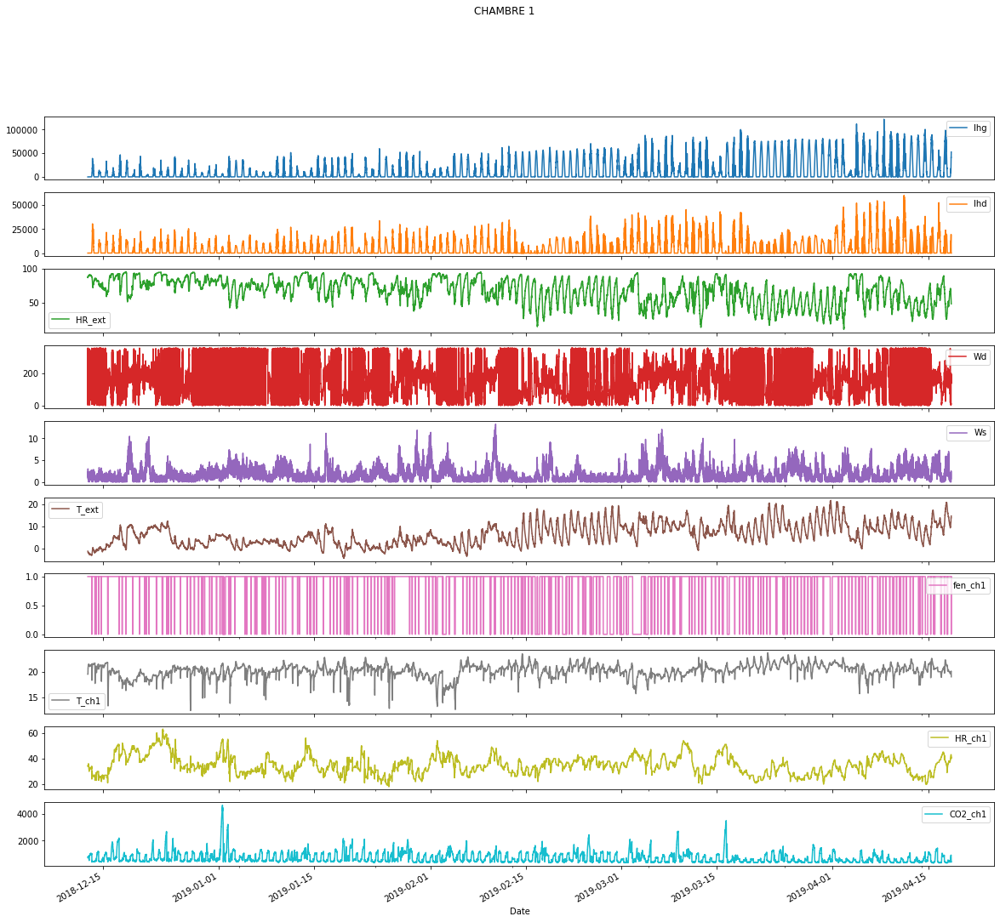

In [12]:
df1.plot(x='Date',x_compat=True,subplots=True,figsize=(20,18),title='CHAMBRE 1')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

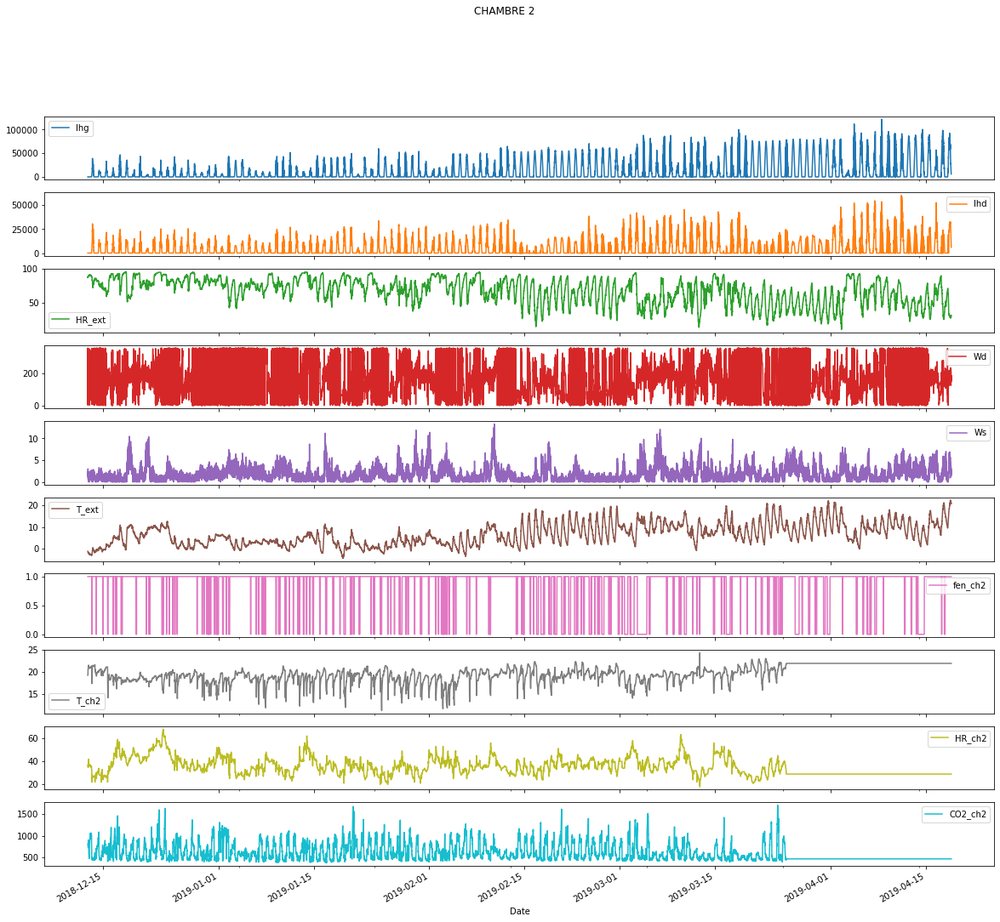

In [105]:
df2.plot(x='Date',x_compat=True,subplots=True,figsize=(20,18),title='CHAMBRE 2')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

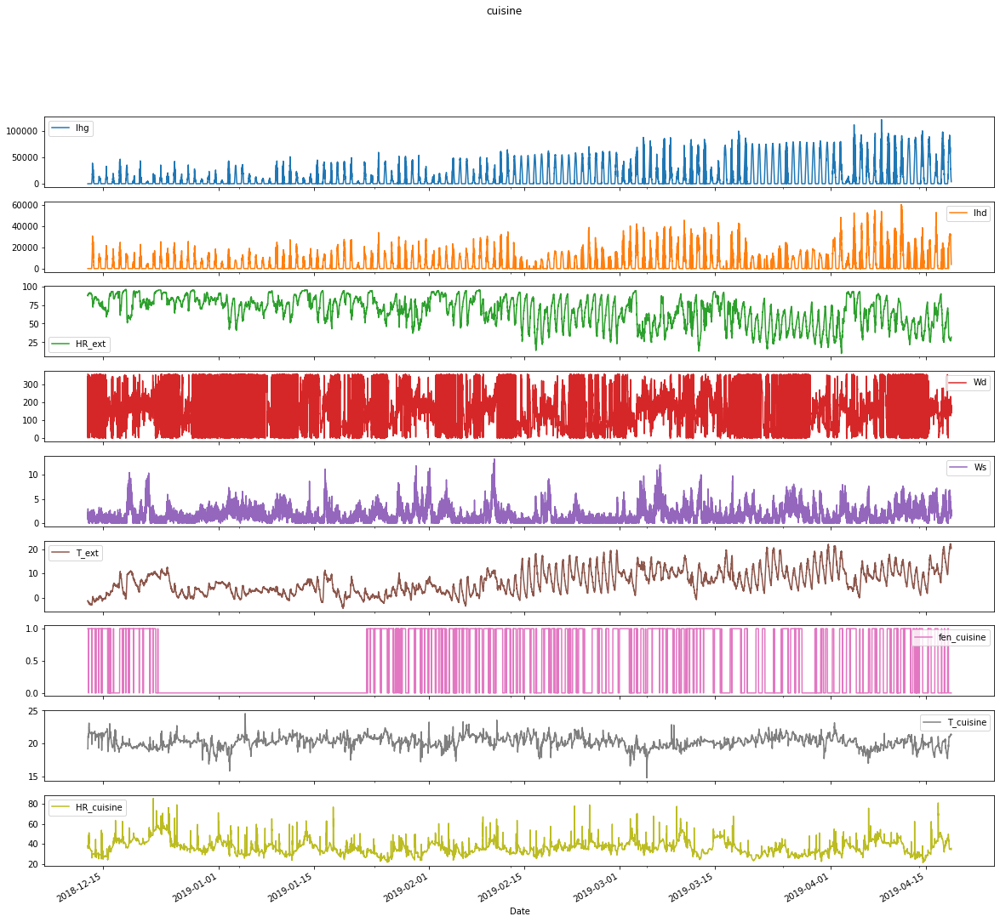

In [19]:
dfc.plot(x='Date',x_compat=True,subplots=True,figsize=(20,18),title='cuisine')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

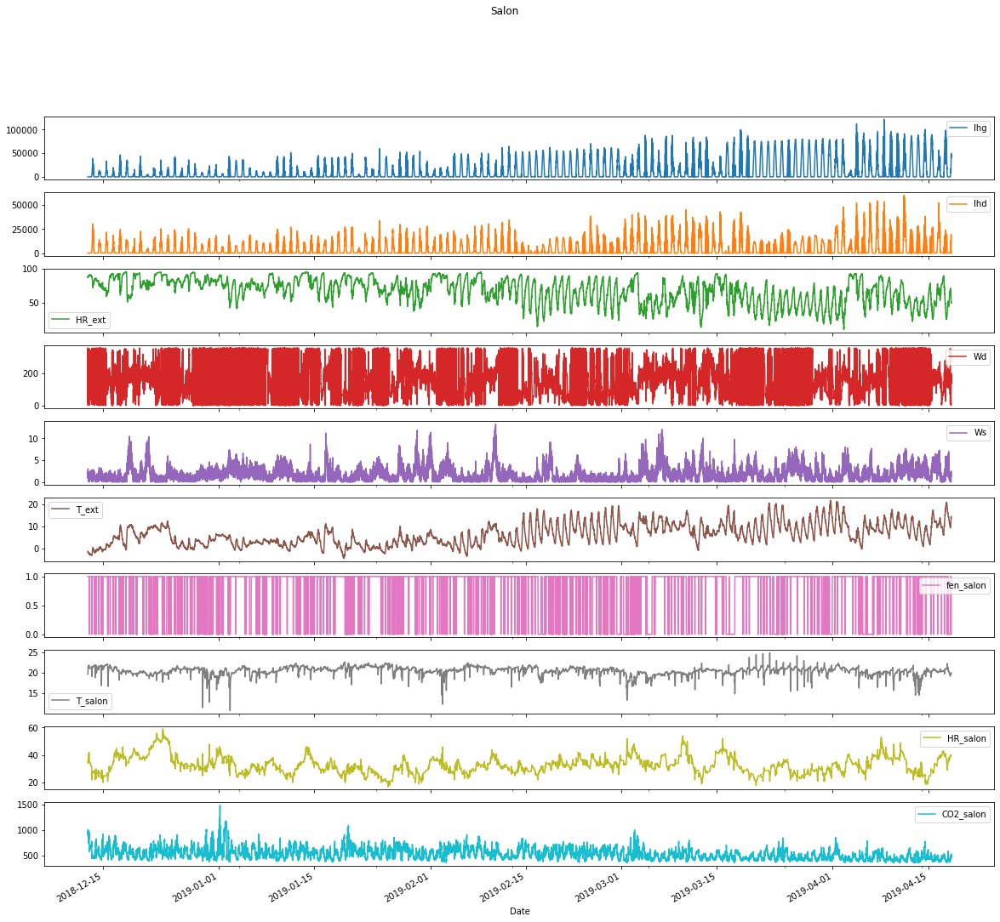

In [20]:
dfs.plot(x='Date',x_compat=True,subplots=True,figsize=(20,18),title='Salon')

(<AxesSubplot:title={'center':'Camp1N4'}, ylabel='fen_ch1'>,
 1    0.882919
 0    0.117081
 Name: fen_ch1, dtype: float64)

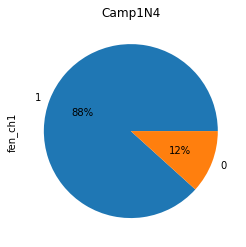

In [12]:
df1['fen_ch1'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp1N4'),df1['fen_ch1'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'Camp1N4'}, ylabel='fen_ch2'>,
 1    0.85615
 0    0.14385
 Name: fen_ch2, dtype: float64)

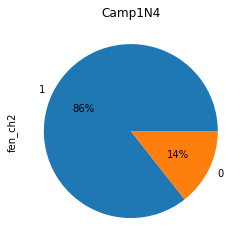

In [13]:
df2['fen_ch2'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp1N4'),df2['fen_ch2'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'Camp1N4'}, ylabel='fen_cuisine'>,
 0    0.542105
 1    0.457895
 Name: fen_cuisine, dtype: float64)

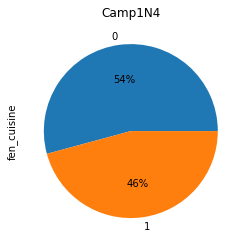

In [26]:
dfc['fen_cuisine'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp1N4'),dfc['fen_cuisine'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'Camp1N4'}, ylabel='fen_salon'>,
 1    0.842452
 0    0.157548
 Name: fen_salon, dtype: float64)

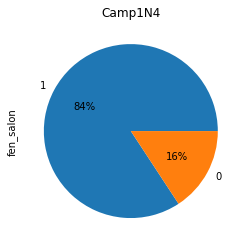

In [27]:
dfs['fen_salon'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp1N4'),dfs['fen_salon'].value_counts(normalize=True)

In [50]:
f1_df = df1[df1['fen_ch1']==1]
f2_df = df2[df2['fen_ch2']==1]
fc_df = dfc[dfc['fen_cuisine']==1]
fs_df = dfs[dfs['fen_salon']==1]

In [51]:
o1_df = df1[df1['fen_ch1']==0]
o2_df = df2[df2['fen_ch2']==0]
oc_df = dfc[dfc['fen_cuisine']==0]
os_df = dfs[dfs['fen_salon']==0]

In [52]:
f1_df

,Date,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_ch1,T_ch1,HR_ch1,CO2_ch1
0,2018-12-12 19:00:00,0,0,88,312,1.3,-1.1,1,NaN,NaN,NaN
1,2018-12-12 19:05:00,0,0,88,359,1.8,-1.2,1,NaN,NaN,NaN
2,2018-12-12 19:10:00,0,0,88,305,2.3,-1.2,1,NaN,NaN,NaN
3,2018-12-12 19:15:00,0,0,87,333,1.4,-1.3,1,NaN,NaN,NaN
4,2018-12-12 19:20:00,0,0,88,345,2.0,-1.3,1,19.5,34.0,742.0
...,...,...,...,...,...,...,...,...,...,...,...
36438,2019-04-18 08:30:00,41620,-99,54,183,0.5,13.9,1,20.1,43.0,835.0
36439,2019-04-18 08:35:00,42490,19418,52,159,2.5,14.0,1,20.1,43.0,835.0
36440,2019-04-18 08:40:00,40900,18827,52,138,1.3,14.0,1,20.1,42.0,647.0
36441,2019-04-18 08:45:00,46330,-99,51,195,1.4,14.4,1,20.1,42.0,647.0


In [53]:
o1_df

,Date,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_ch1,T_ch1,HR_ch1,CO2_ch1
168,2018-12-13 09:00:00,2862,2862,88,30,1.5,-2.8,0,21.5,34.0,986.0
169,2018-12-13 09:05:00,3029,3029,89,7,1.3,-2.8,0,21.5,34.0,986.0
299,2018-12-13 19:55:00,0,0,85,9,1.0,-1.4,0,21.7,27.0,525.0
300,2018-12-13 20:00:00,0,0,85,358,1.5,-1.5,0,21.3,23.0,470.0
301,2018-12-13 20:05:00,0,0,85,356,1.3,-1.4,0,21.3,23.0,470.0
...,...,...,...,...,...,...,...,...,...,...,...
36294,2019-04-17 20:30:00,0,0,45,180,1.8,16.1,0,20.2,35.0,387.0
36295,2019-04-17 20:35:00,0,0,43,189,2.7,16.2,0,20.2,35.0,387.0
36296,2019-04-17 20:40:00,0,0,43,174,3.5,16.3,0,20.1,35.0,406.0
36442,2019-04-18 08:50:00,47850,-99,49,137,1.6,14.5,0,19.7,40.0,414.0


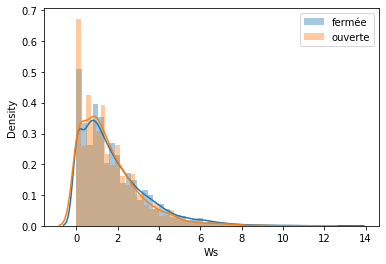

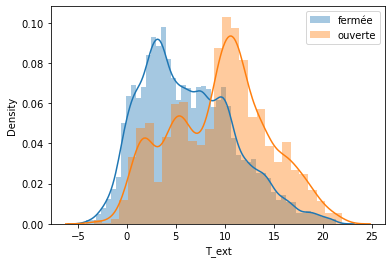

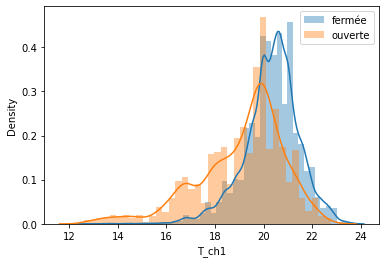

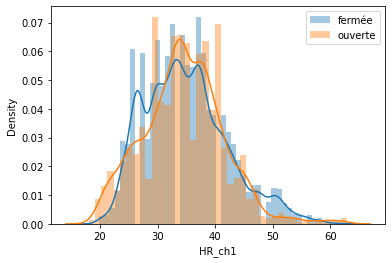

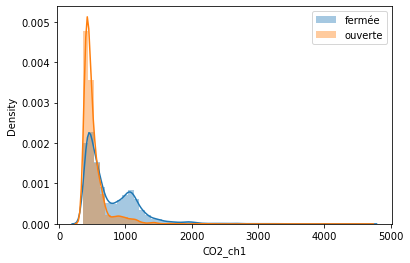

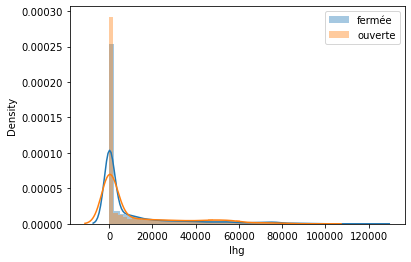

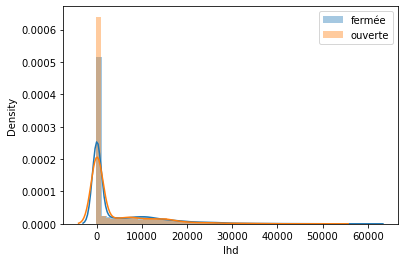

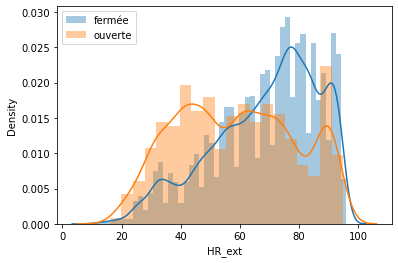

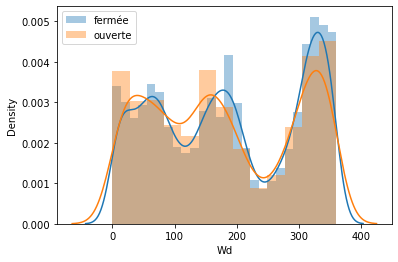

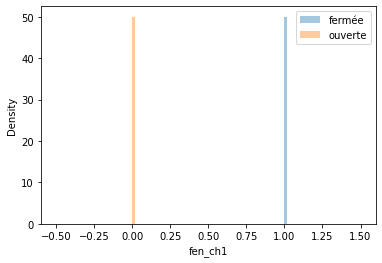

In [25]:
for col in df1.select_dtypes('float'):
    plt.figure()
    sns.distplot(f1_df[col],label='fermée')
    sns.distplot(o1_df[col],label='ouverte')
    
    plt.legend()
for col in df1.select_dtypes('int'):
    plt.figure()
    sns.distplot(f1_df[col],label='fermée')
    sns.distplot(o1_df[col],label='ouverte')
    
    plt.legend()

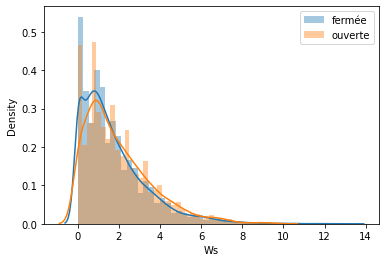

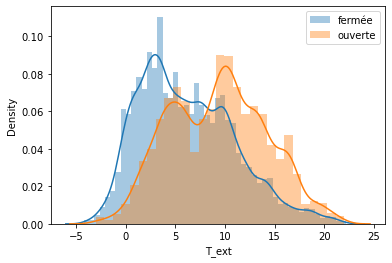

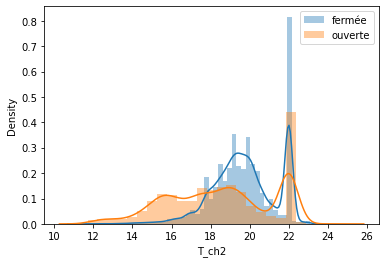

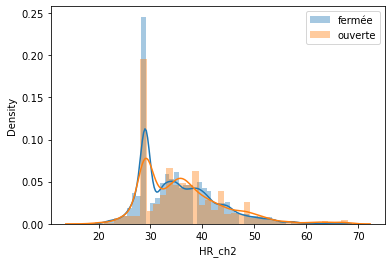

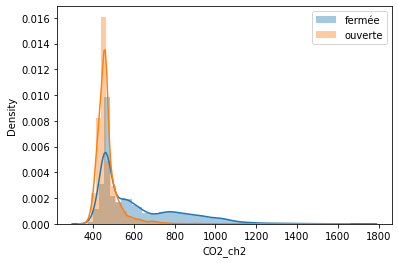

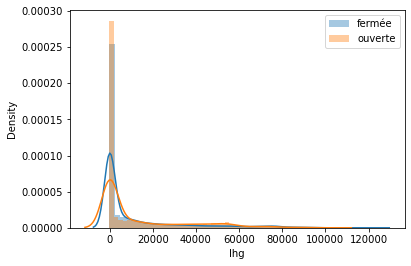

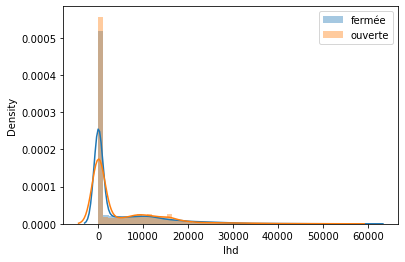

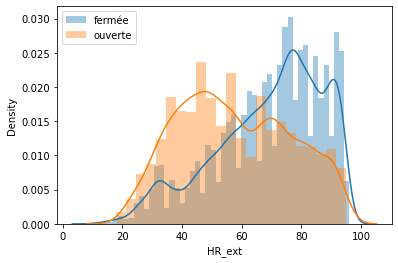

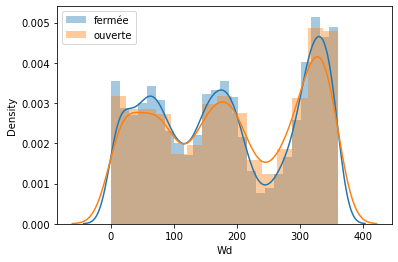

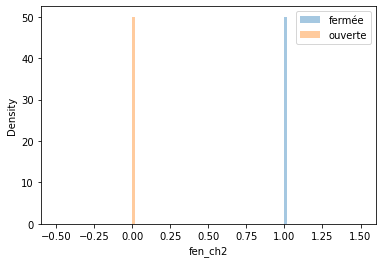

In [26]:
for col in df2.select_dtypes('float'):
    plt.figure()
    sns.distplot(f2_df[col],label='fermée')
    sns.distplot(o2_df[col],label='ouverte')
    plt.legend()
for col in df2.select_dtypes('int'):
    plt.figure()
    sns.distplot(f2_df[col],label='fermée')
    sns.distplot(o2_df[col],label='ouverte')
    plt.legend()

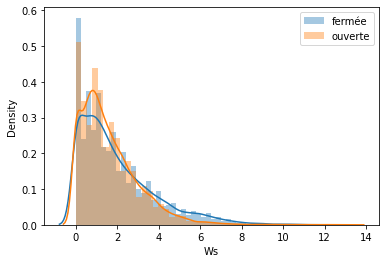

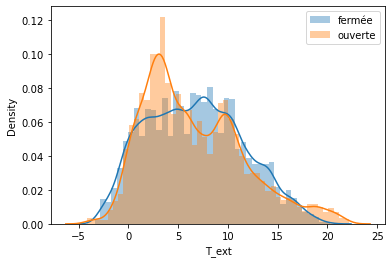

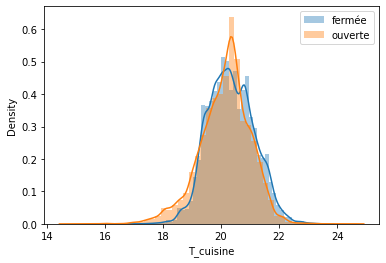

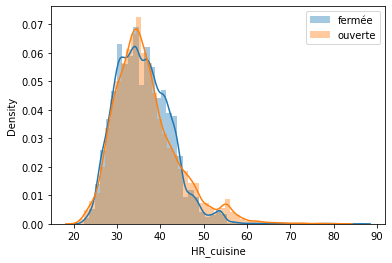

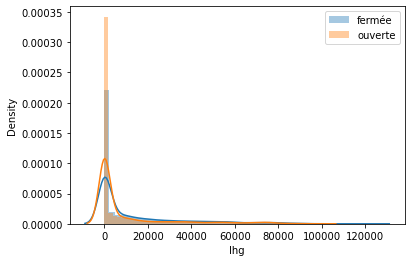

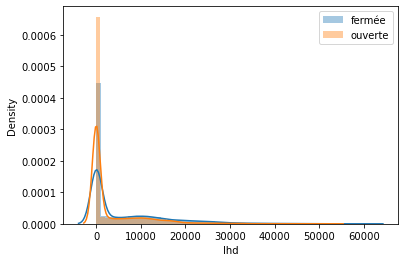

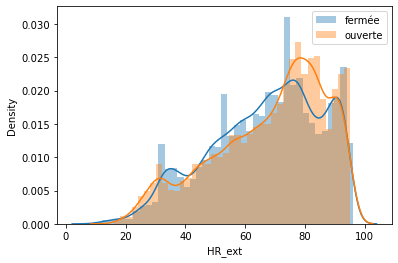

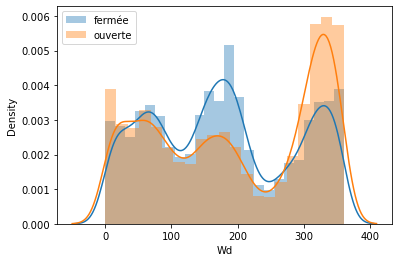

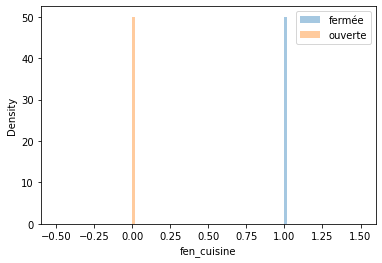

In [27]:
for col in dfc.select_dtypes('float'):
    plt.figure()
    sns.distplot(fc_df[col],label='fermée')
    sns.distplot(oc_df[col],label='ouverte')
    plt.legend()
for col in dfc.select_dtypes('int'):
    plt.figure()
    sns.distplot(fc_df[col],label='fermée')
    sns.distplot(oc_df[col],label='ouverte')
    plt.legend()

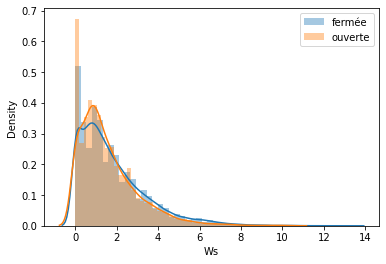

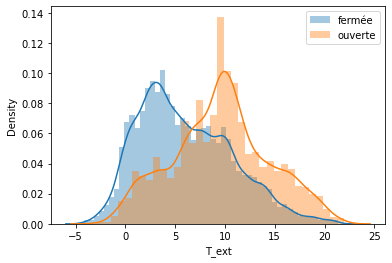

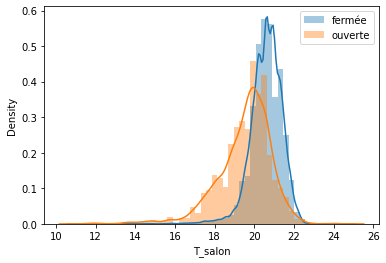

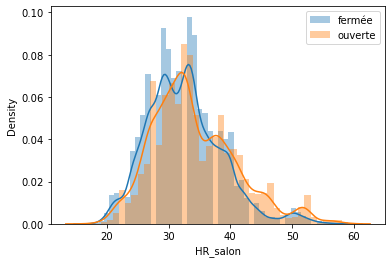

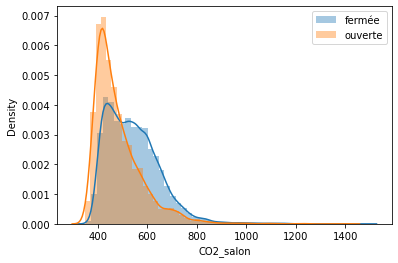

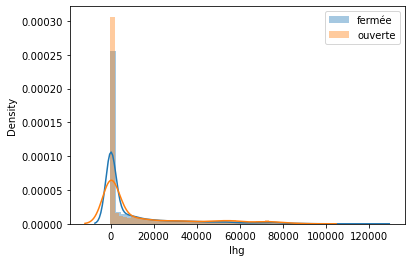

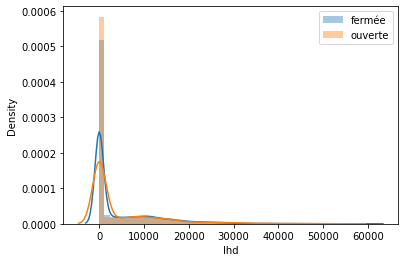

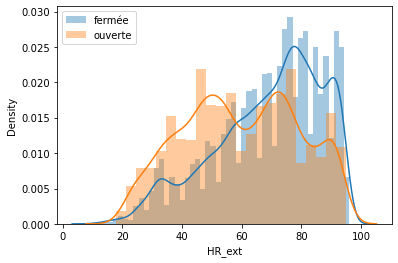

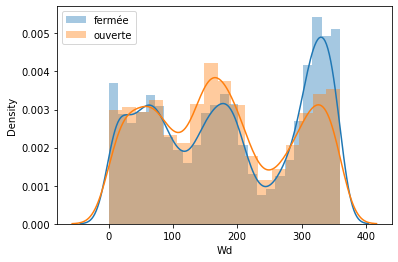

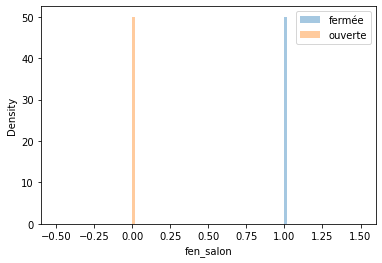

In [28]:
for col in dfs.select_dtypes('float'):
    plt.figure()
    sns.distplot(fs_df[col],label='fermée')
    sns.distplot(os_df[col],label='ouverte')
    #plt.title('Camp1N4')
    plt.legend()
for col in dfs.select_dtypes('int'):
    plt.figure()
    sns.distplot(fs_df[col],label='fermée')
    sns.distplot(os_df[col],label='ouverte')
    #plt.title('Camp1N4')
    plt.legend()

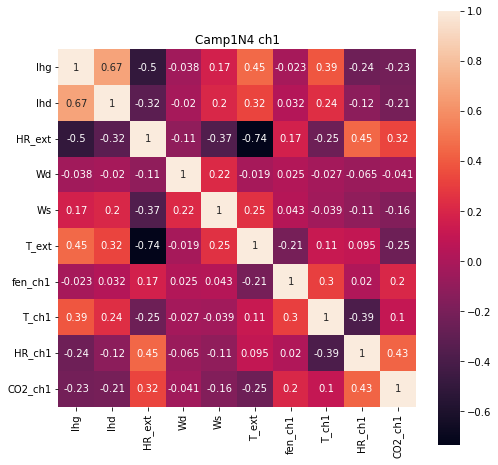

In [35]:
plt.subplots(figsize=(8,8))
sns.heatmap(df1.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Camp1N4 ch1')
plt.show()

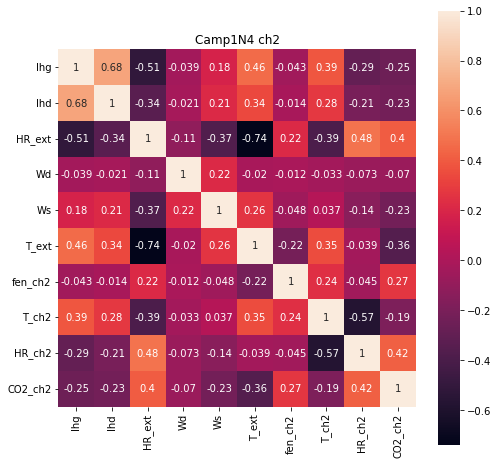

In [36]:
plt.subplots(figsize=(8,8))
sns.heatmap(df2.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Camp1N4 ch2')
plt.show()

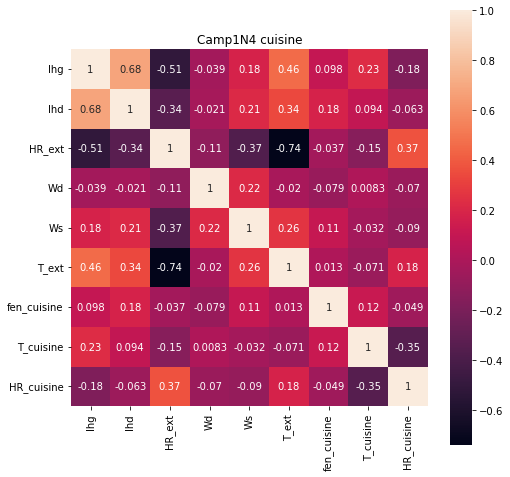

In [37]:
plt.subplots(figsize=(8,8))
sns.heatmap(dfc.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Camp1N4 cuisine')
plt.show()

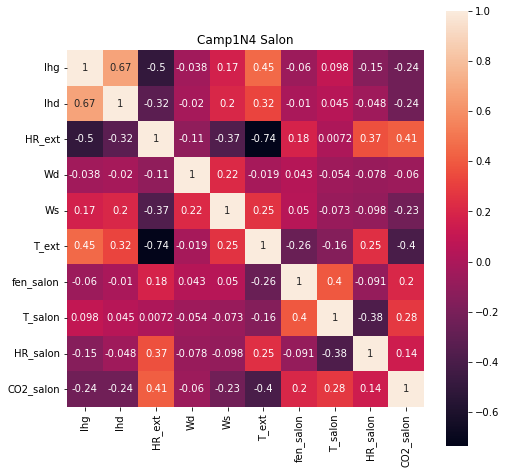

In [38]:
plt.subplots(figsize=(8,8))
sns.heatmap(dfs.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Camp1N4 Salon')
plt.show()

In [48]:
z=df1[df1['T_ext']>10]

In [49]:
z['fen_ch1'].value_counts()


1    6859
0    2071
Name: fen_ch1, dtype: int64

In [70]:
pd.to_datetime(df1['Date'], format='%m/%d/%y')
df1=df1.set_index('Date')
#df1=df1.loc['date début':'date fin']# si ya une anomalie dans les données en peu selection les dates quand veu prendre 
df1['joure'] = df1.index.day_name()
df1['heure'] = df1.index.hour
df1['mois'] = df1.index.month

In [71]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 36445 entries, 2018-12-12 19:00:00 to 2019-04-18 09:00:00
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Ihg      36445 non-null  int64  
 1   Ihd      36445 non-null  int64  
 2   HR_ext   36445 non-null  int64  
 3   Wd       36445 non-null  int64  
 4   Ws       36445 non-null  float64
 5   T_ext    36445 non-null  float64
 6   fen_ch1  36445 non-null  int64  
 7   T_ch1    36441 non-null  float64
 8   HR_ch1   36441 non-null  float64
 9   CO2_ch1  36441 non-null  float64
 10  joure    36445 non-null  object 
 11  heure    36445 non-null  int64  
 12  mois     36445 non-null  int64  
dtypes: float64(5), int64(7), object(1)
memory usage: 3.9+ MB


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

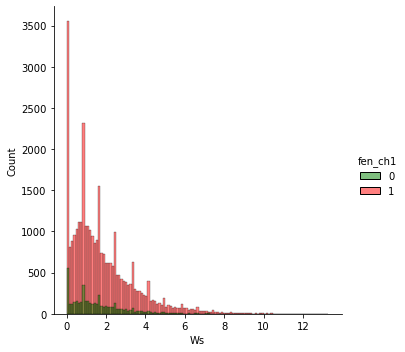

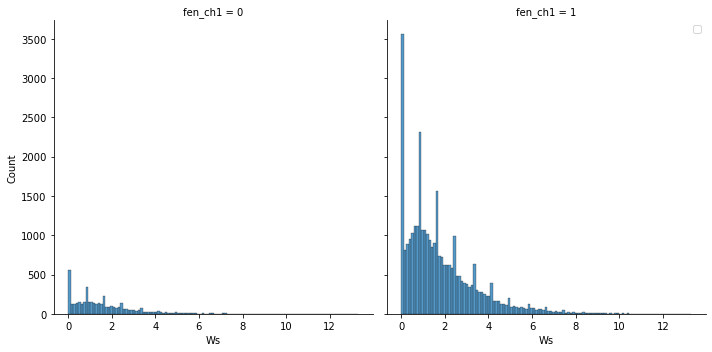

<Figure size 432x288 with 0 Axes>

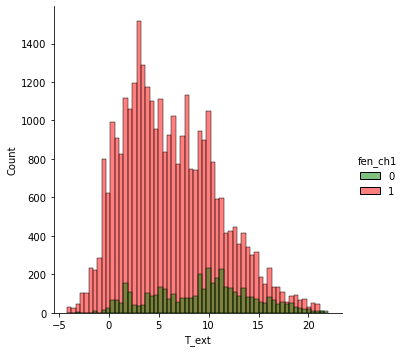

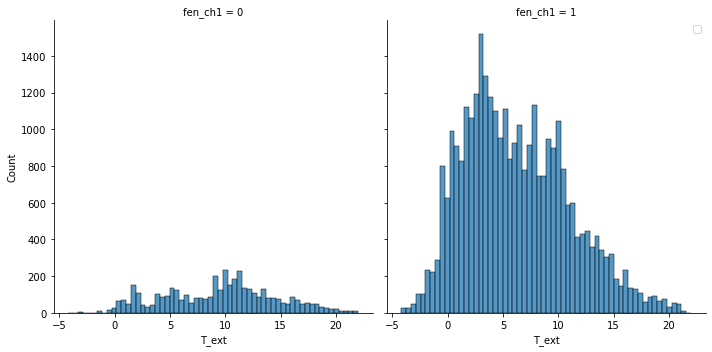

<Figure size 432x288 with 0 Axes>

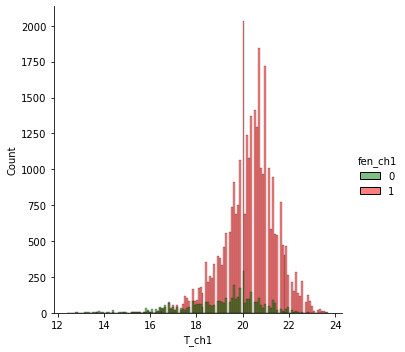

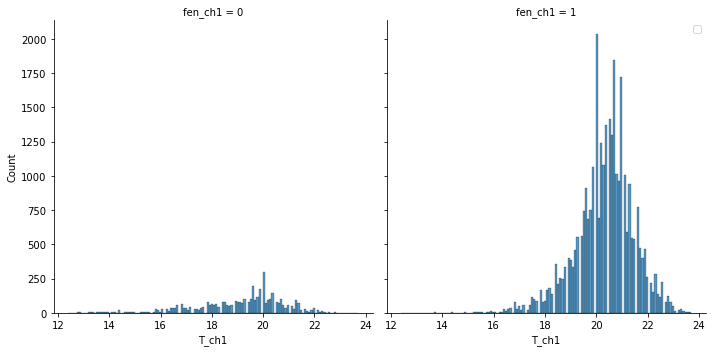

<Figure size 432x288 with 0 Axes>

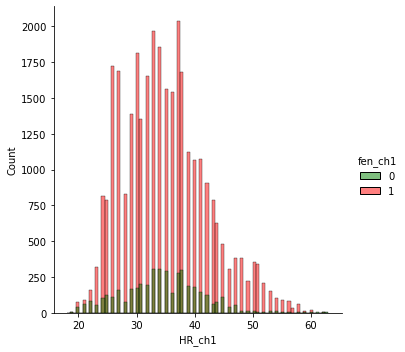

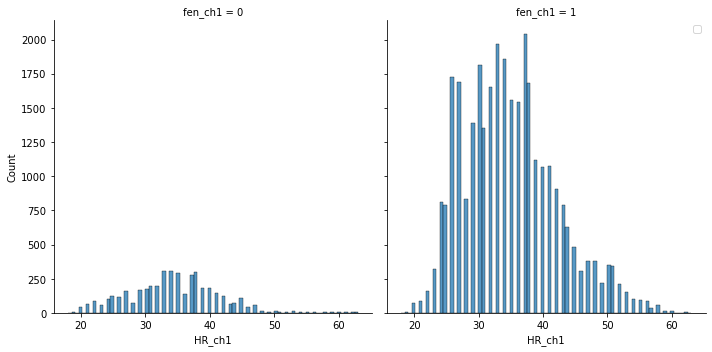

<Figure size 432x288 with 0 Axes>

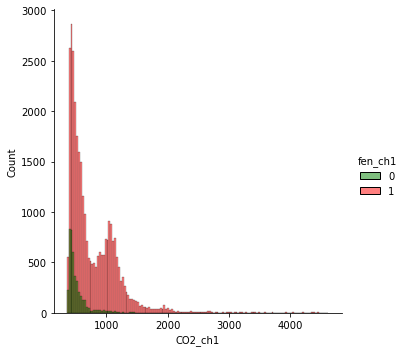

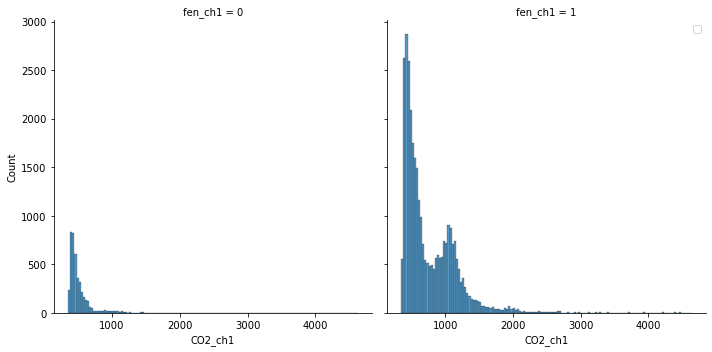

<Figure size 432x288 with 0 Axes>

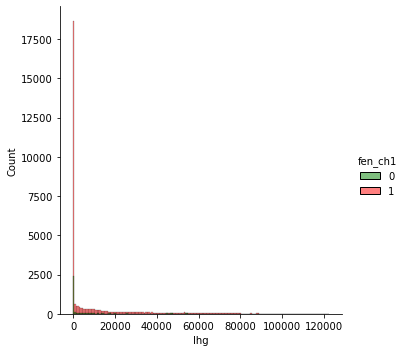

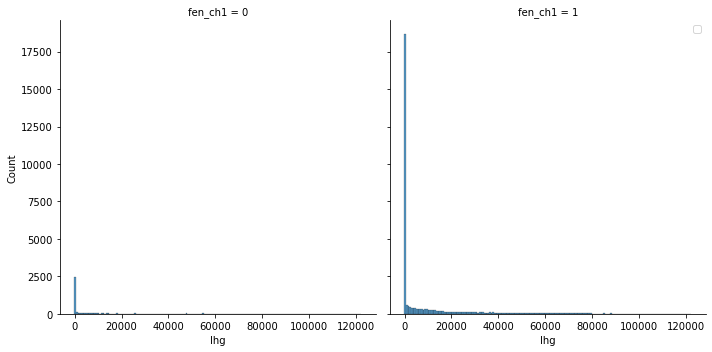

<Figure size 432x288 with 0 Axes>

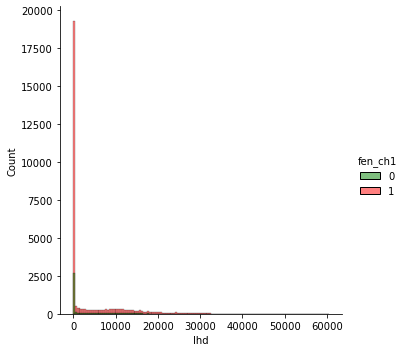

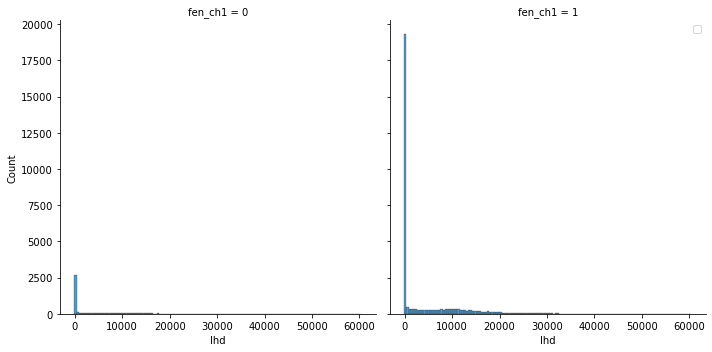

<Figure size 432x288 with 0 Axes>

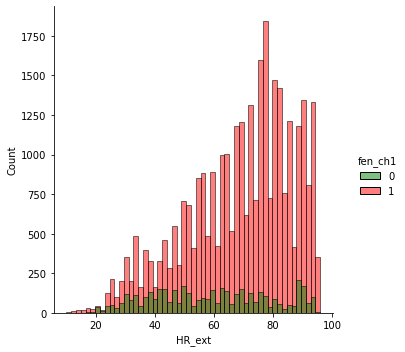

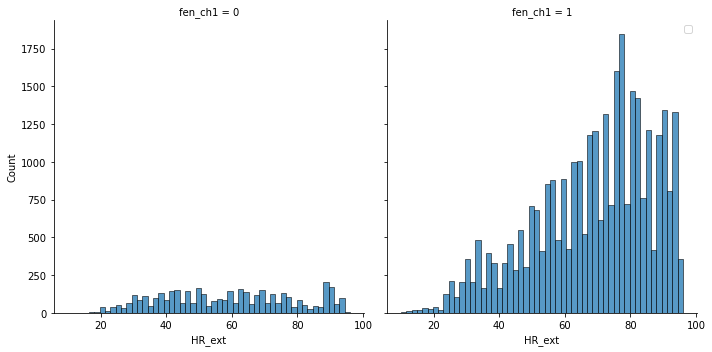

<Figure size 432x288 with 0 Axes>

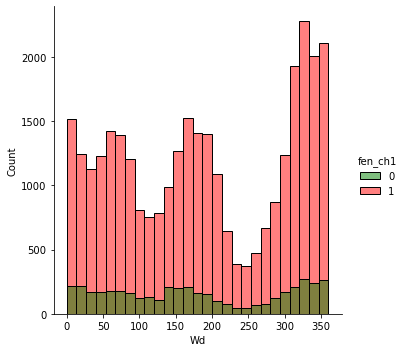

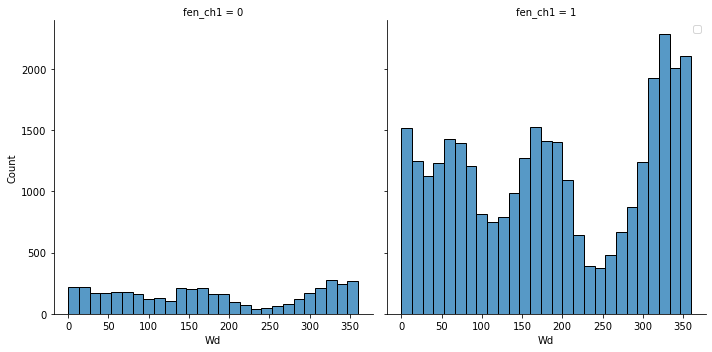

<Figure size 432x288 with 0 Axes>

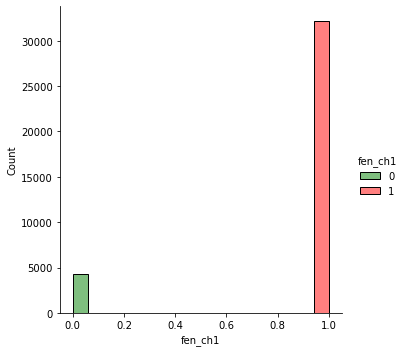

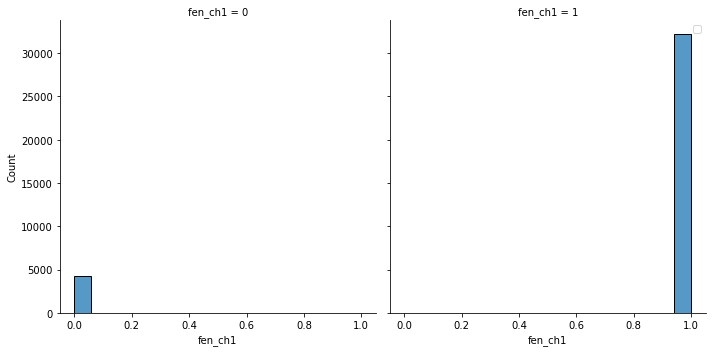

<Figure size 432x288 with 0 Axes>

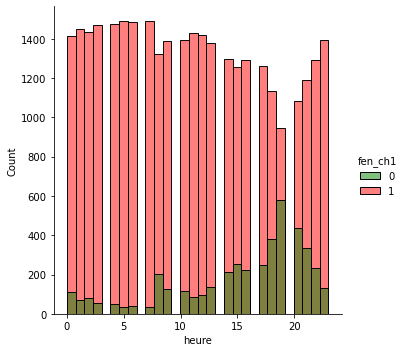

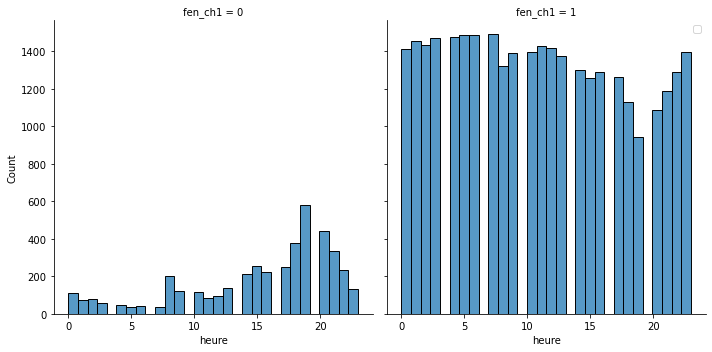

<Figure size 432x288 with 0 Axes>

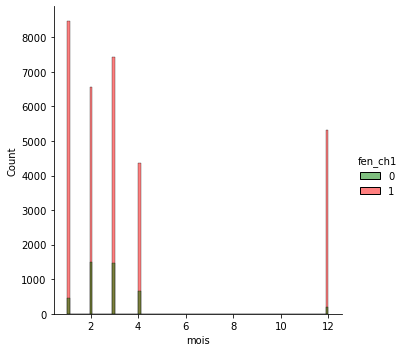

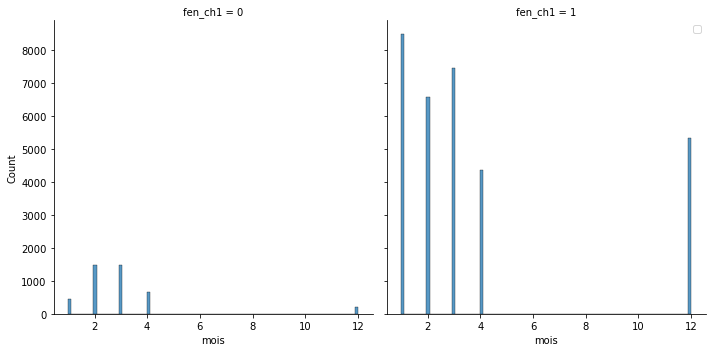

<Figure size 432x288 with 0 Axes>

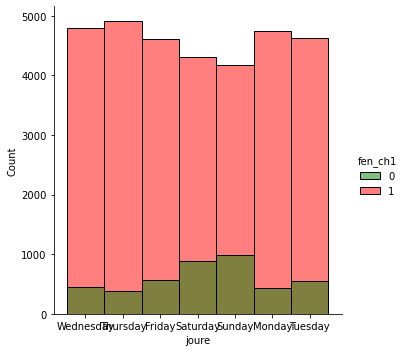

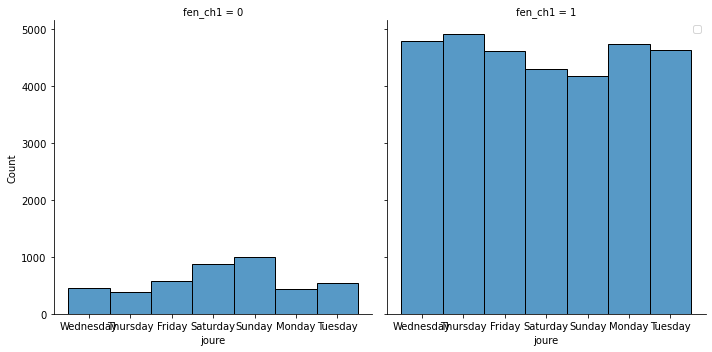

In [72]:
for col in df1.select_dtypes('float'):
    plt.figure()
    sns.displot(data=df1,x=col,hue="fen_ch1",palette=["g","r"])
    sns.displot(data=df1,x=col,col="fen_ch1",palette=["g","r"])
    plt.legend()
for col in df1.select_dtypes('int'):
    plt.figure()
    sns.displot(data=df1,x=col,hue="fen_ch1",palette=["g","r"])
    sns.displot(data=df1,x=col,col="fen_ch1",palette=["g","r"])
    plt.legend()
for col in df1.select_dtypes('object'):
    plt.figure()
    sns.displot(data=df1,x=col,hue="fen_ch1",palette=["g","r"])
    sns.displot(data=df1,x=col,col="fen_ch1",palette=["g","r"])
    plt.legend()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

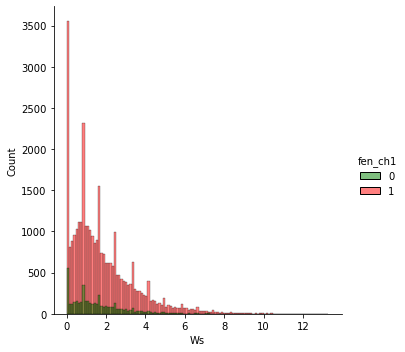

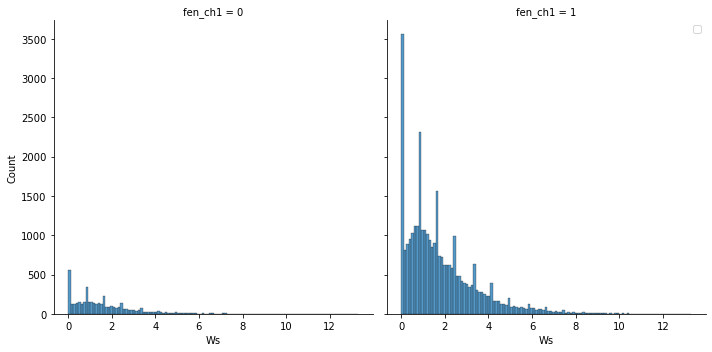

<Figure size 432x288 with 0 Axes>

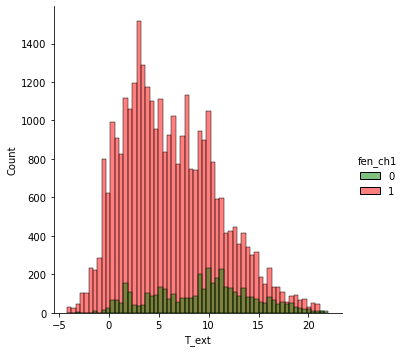

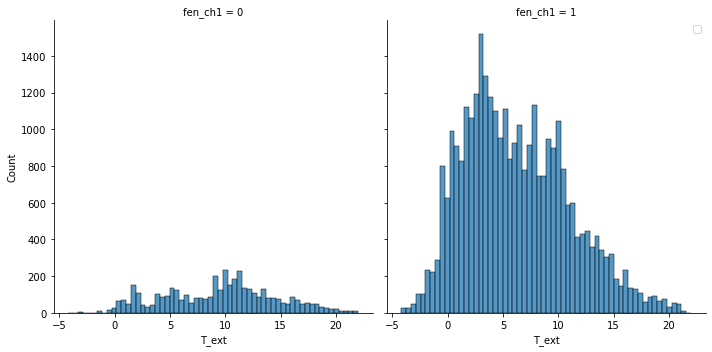

<Figure size 432x288 with 0 Axes>

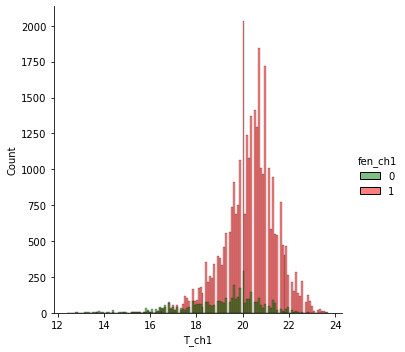

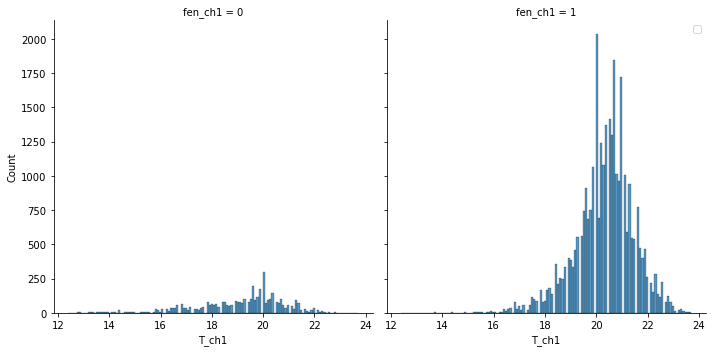

<Figure size 432x288 with 0 Axes>

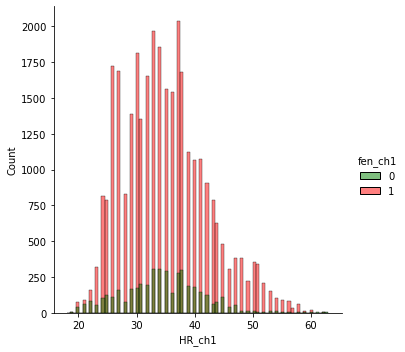

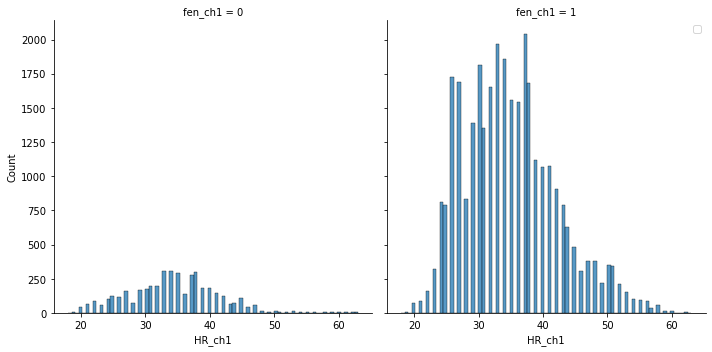

<Figure size 432x288 with 0 Axes>

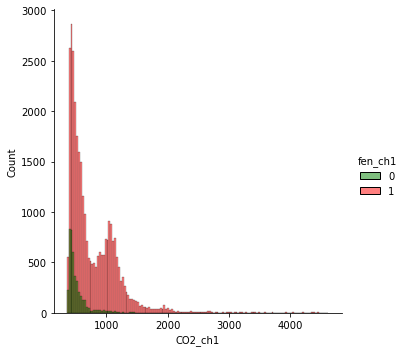

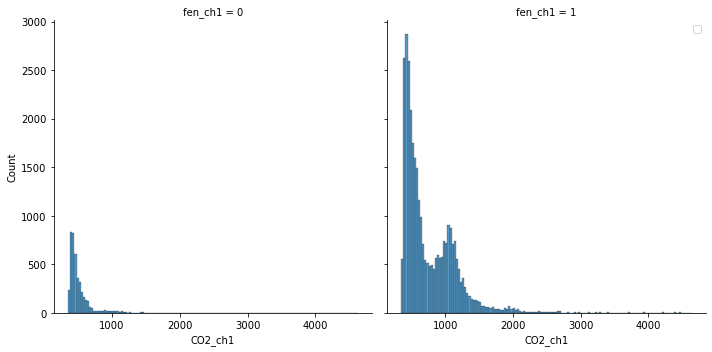

<Figure size 432x288 with 0 Axes>

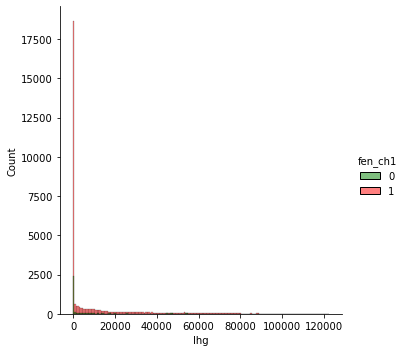

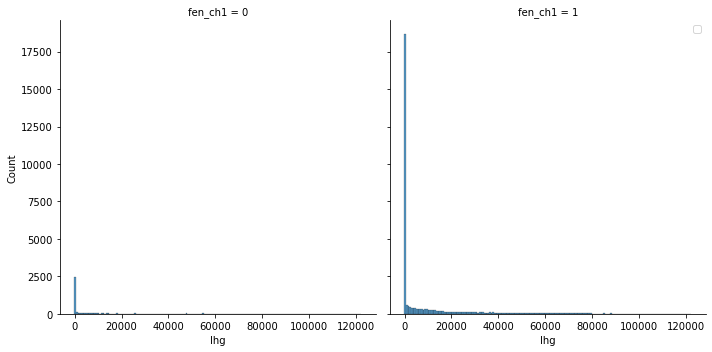

<Figure size 432x288 with 0 Axes>

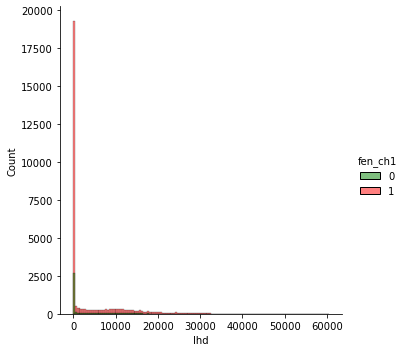

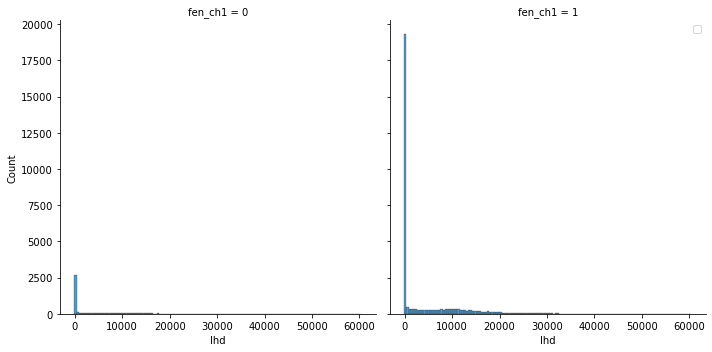

<Figure size 432x288 with 0 Axes>

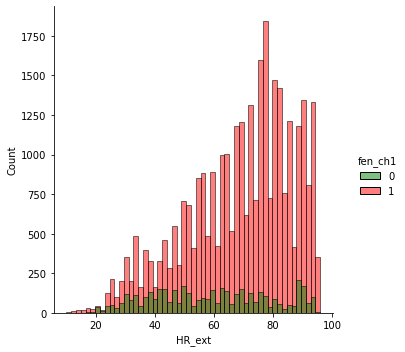

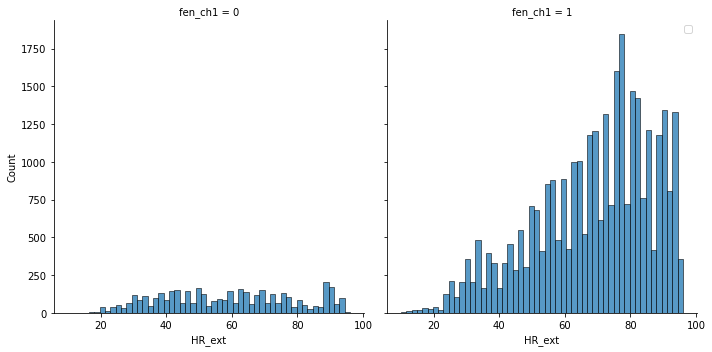

<Figure size 432x288 with 0 Axes>

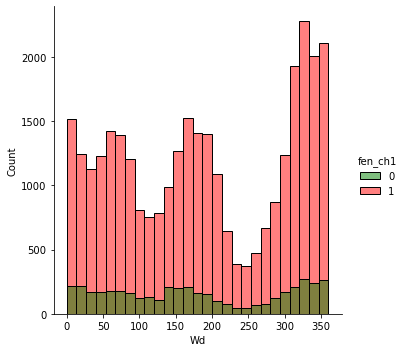

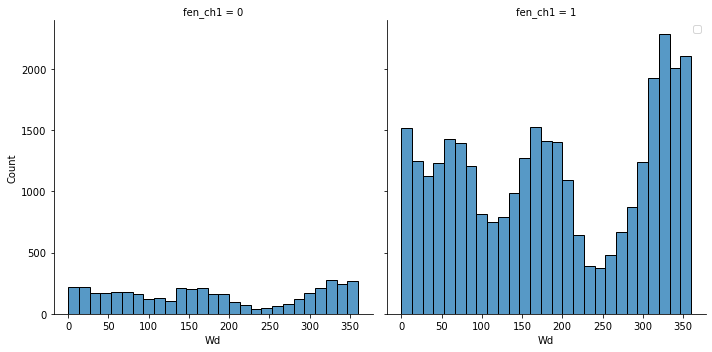

<Figure size 432x288 with 0 Axes>

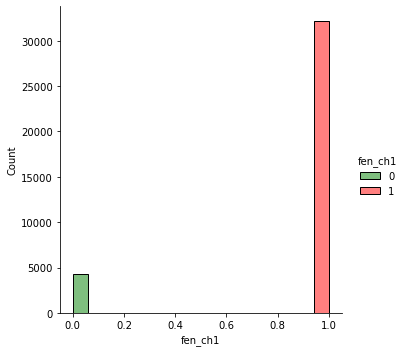

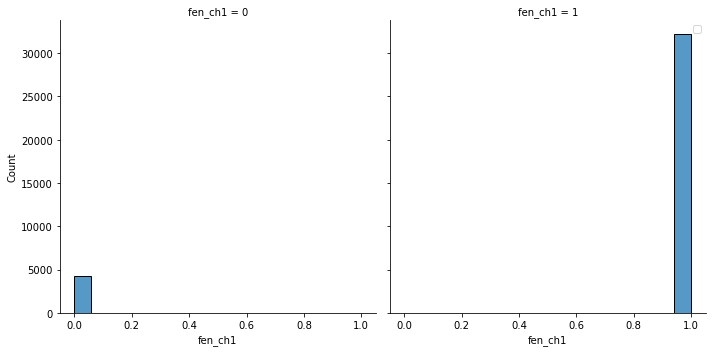

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

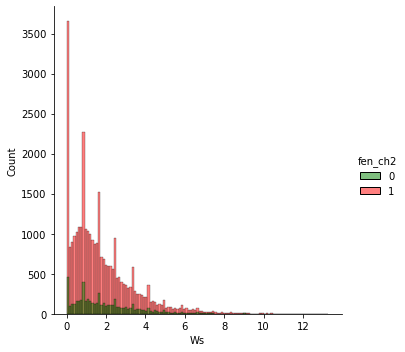

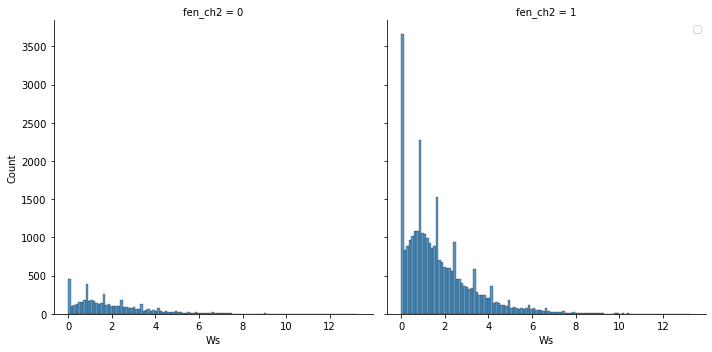

<Figure size 432x288 with 0 Axes>

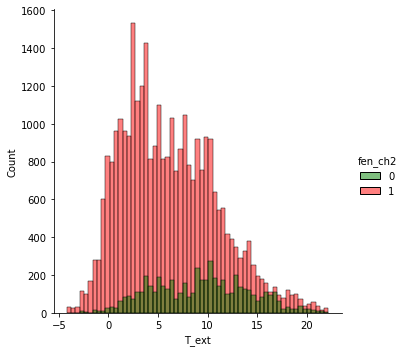

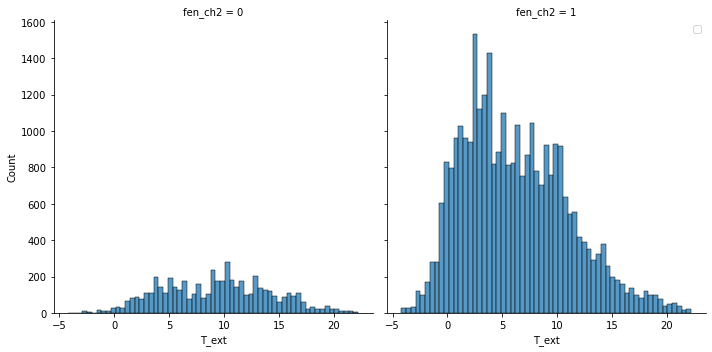

<Figure size 432x288 with 0 Axes>

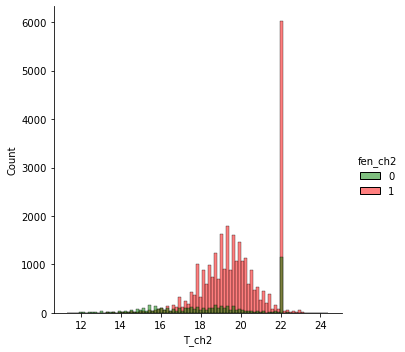

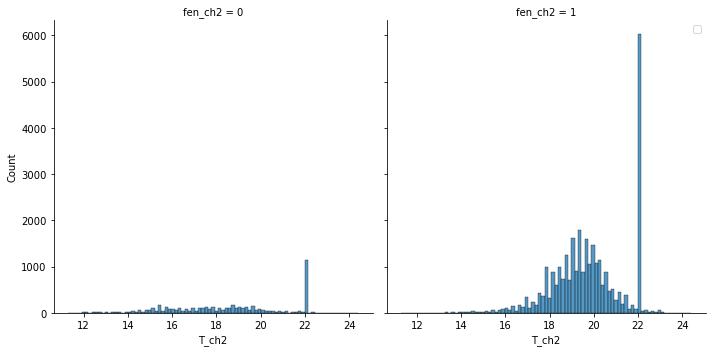

<Figure size 432x288 with 0 Axes>

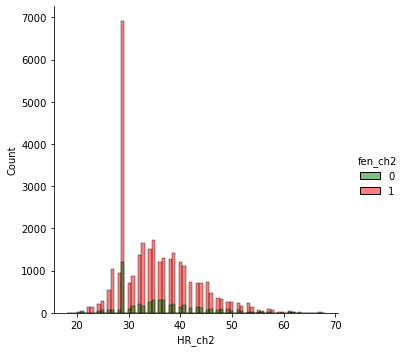

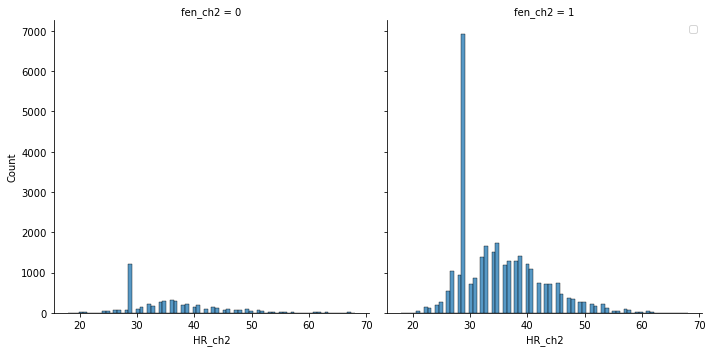

<Figure size 432x288 with 0 Axes>

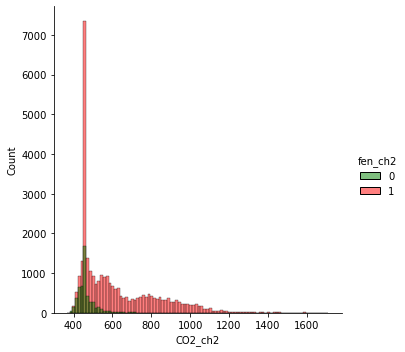

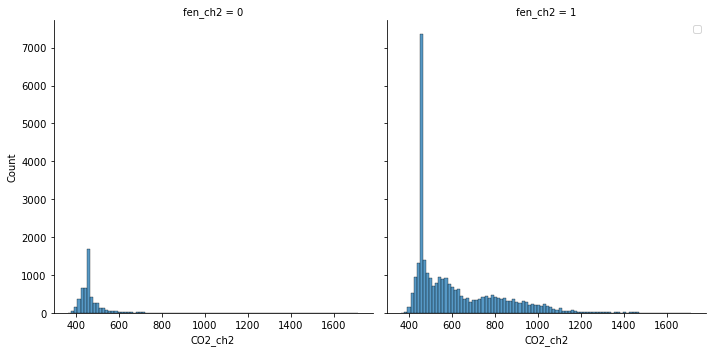

<Figure size 432x288 with 0 Axes>

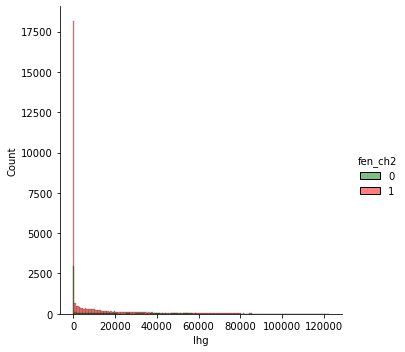

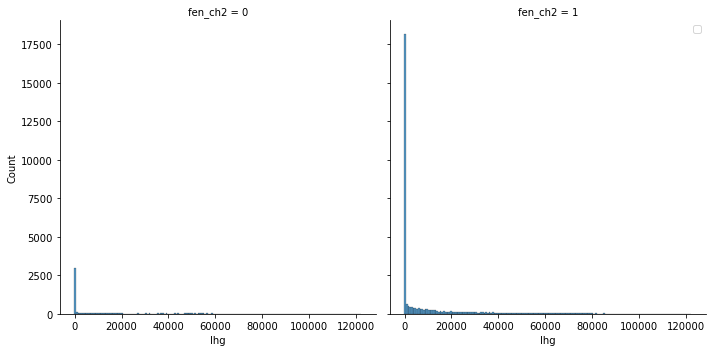

<Figure size 432x288 with 0 Axes>

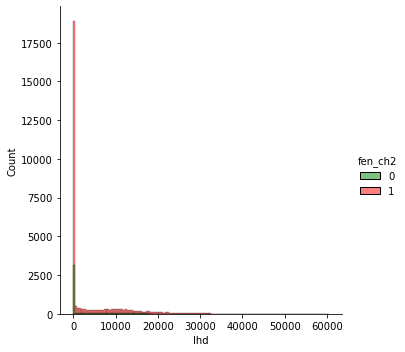

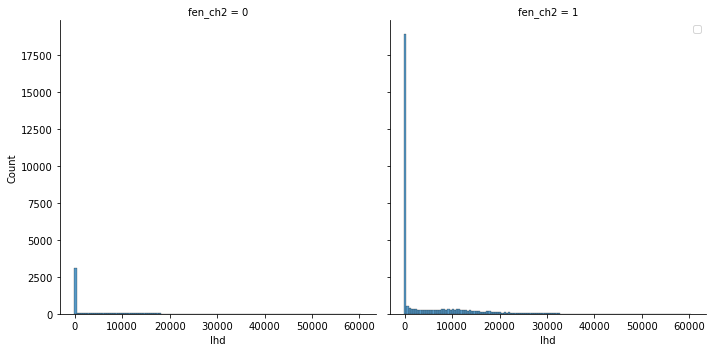

<Figure size 432x288 with 0 Axes>

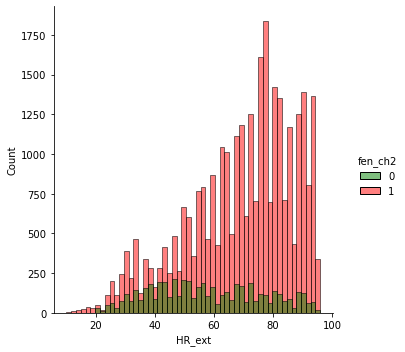

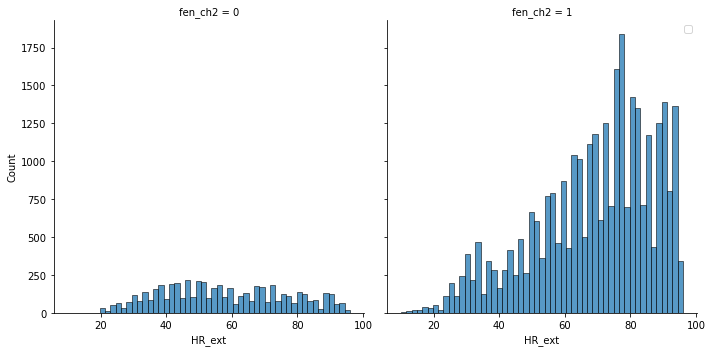

<Figure size 432x288 with 0 Axes>

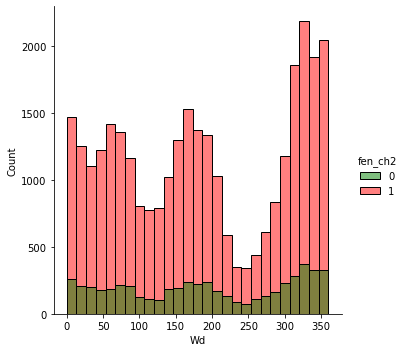

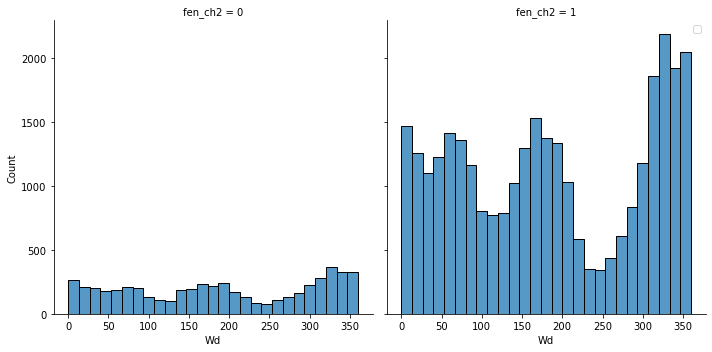

<Figure size 432x288 with 0 Axes>

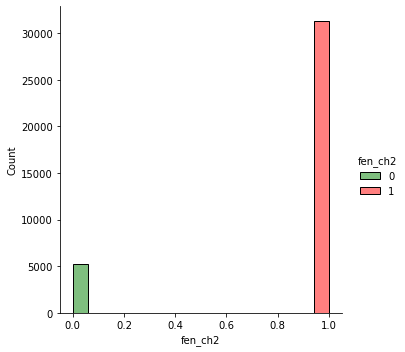

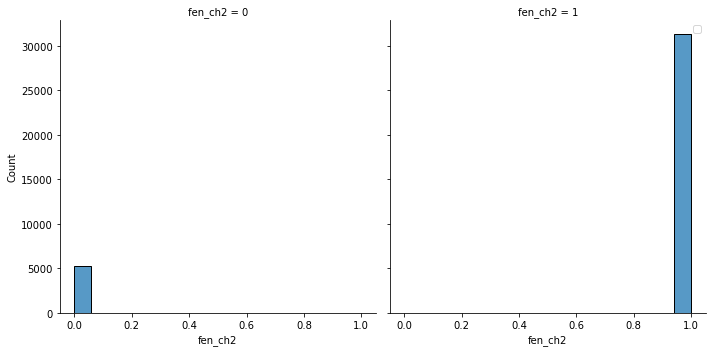

In [40]:
for col in df2.select_dtypes('float'):
    plt.figure()
    sns.displot(data=df2,x=col,hue="fen_ch2",palette=["g","r"])
    sns.displot(data=df2,x=col,col="fen_ch2",palette=["g","r"])
    plt.legend()
for col in df2.select_dtypes('int'):
    plt.figure()
    sns.displot(data=df2,x=col,hue="fen_ch2",palette=["g","r"])
    sns.displot(data=df2,x=col,col="fen_ch2",palette=["g","r"])
    plt.legend()    

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

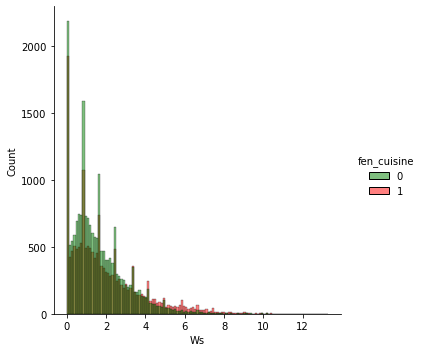

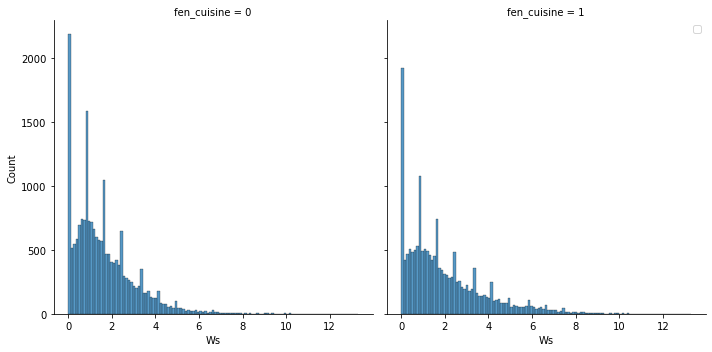

<Figure size 432x288 with 0 Axes>

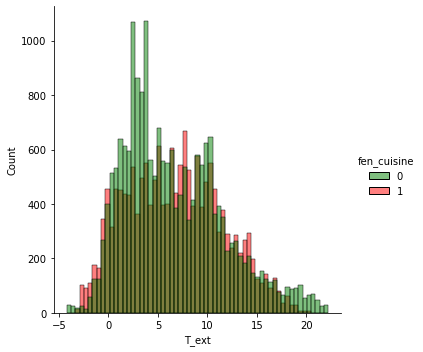

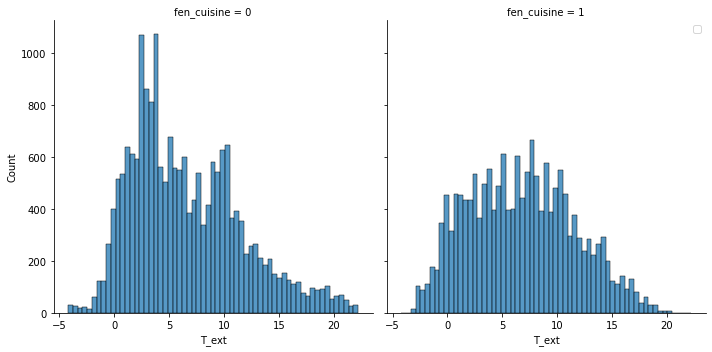

<Figure size 432x288 with 0 Axes>

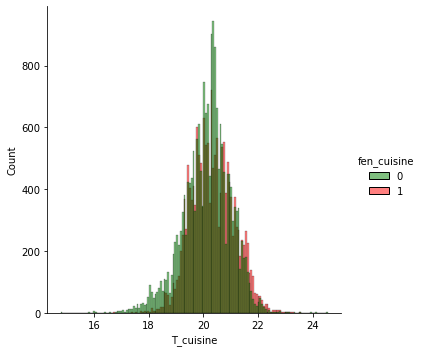

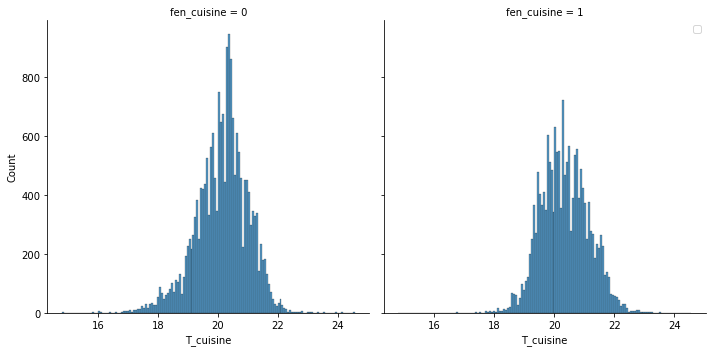

<Figure size 432x288 with 0 Axes>

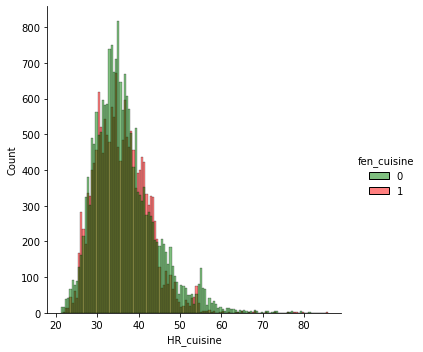

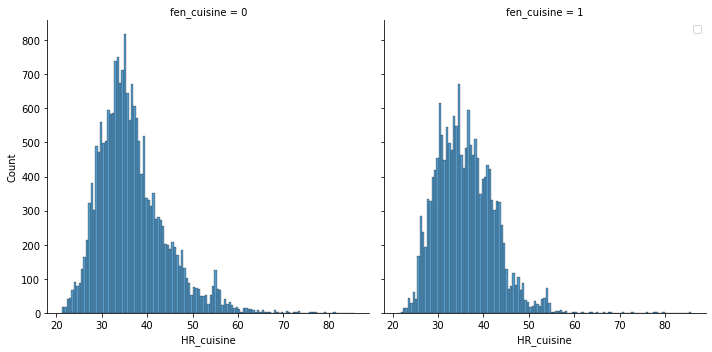

<Figure size 432x288 with 0 Axes>

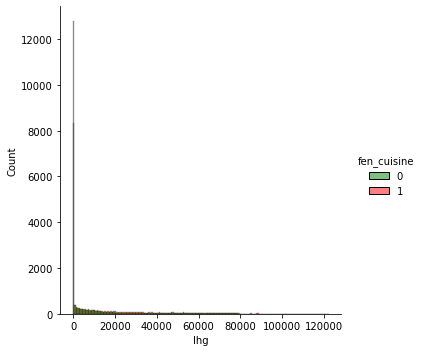

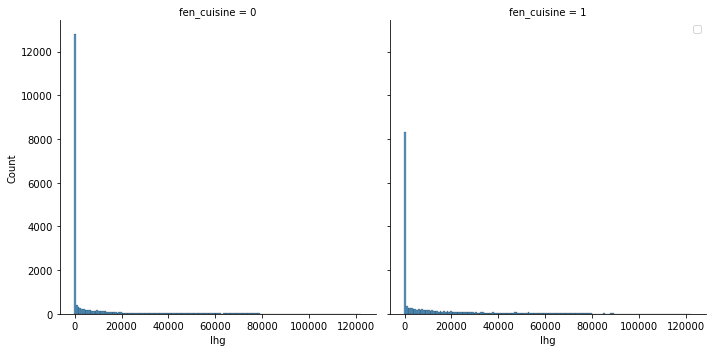

<Figure size 432x288 with 0 Axes>

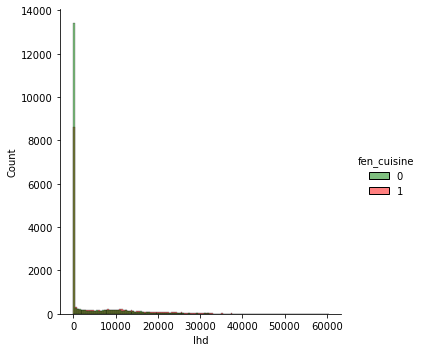

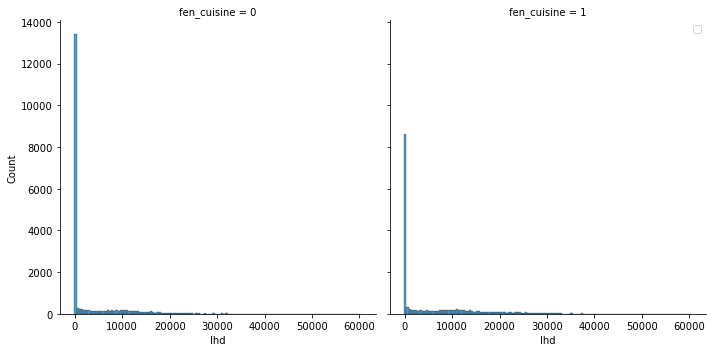

<Figure size 432x288 with 0 Axes>

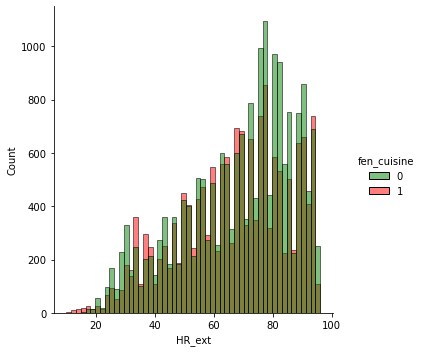

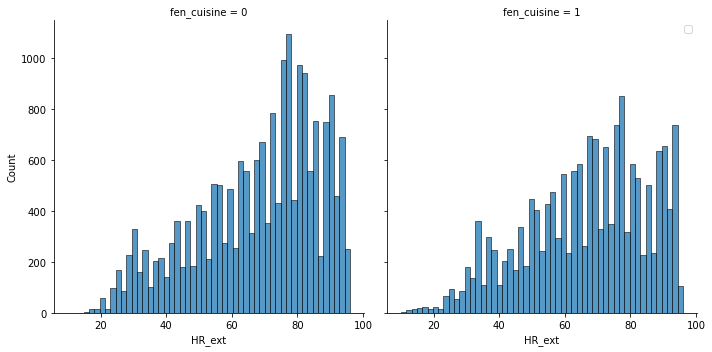

<Figure size 432x288 with 0 Axes>

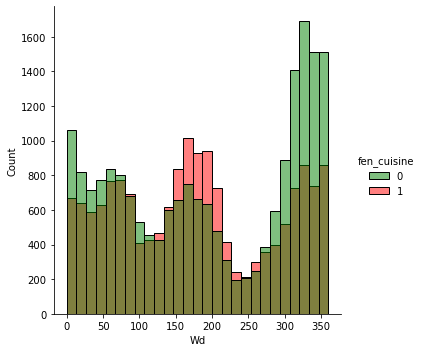

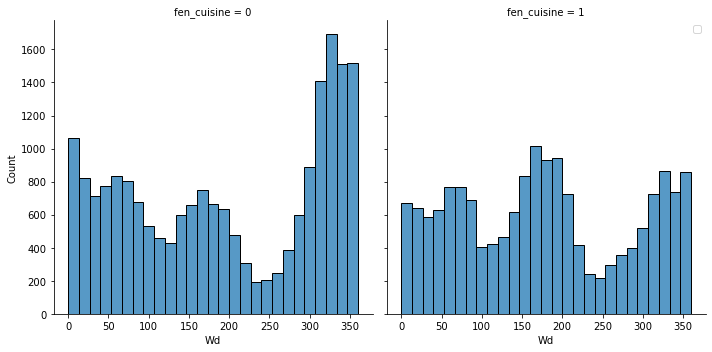

<Figure size 432x288 with 0 Axes>

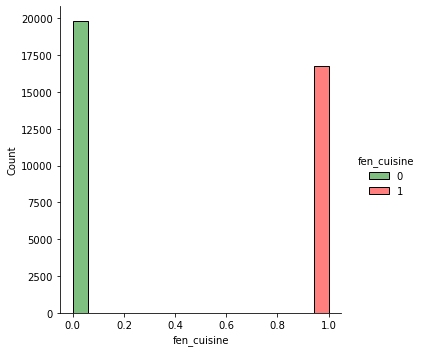

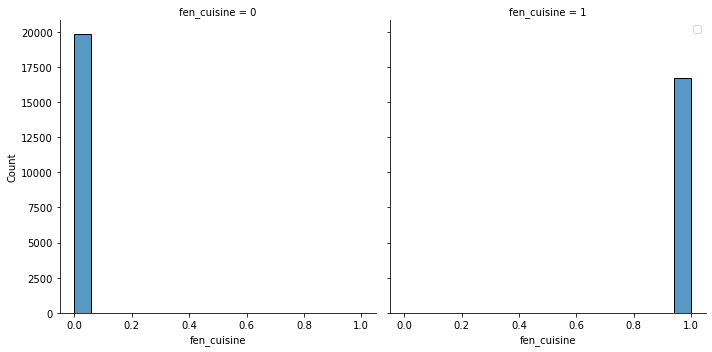

In [41]:
for col in dfc.select_dtypes('float'):
    plt.figure()
    sns.displot(data=dfc,x=col,hue="fen_cuisine",palette=["g","r"])
    sns.displot(data=dfc,x=col,col="fen_cuisine",palette=["g","r"])
    plt.legend()
for col in dfc.select_dtypes('int'):
    plt.figure()
    sns.displot(data=dfc,x=col,hue="fen_cuisine",palette=["g","r"])
    sns.displot(data=dfc,x=col,col="fen_cuisine",palette=["g","r"])
    plt.legend()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

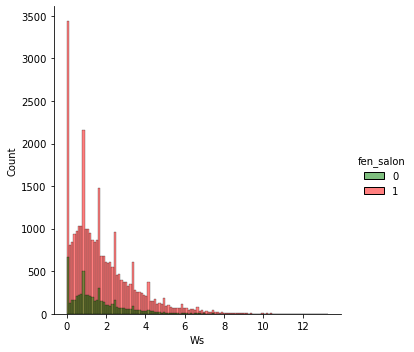

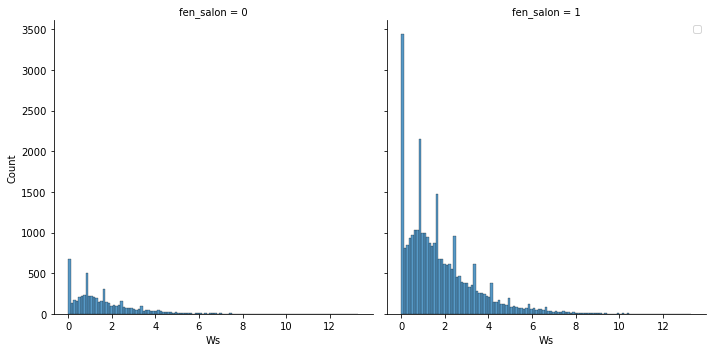

<Figure size 432x288 with 0 Axes>

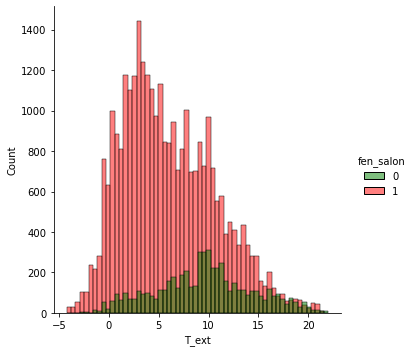

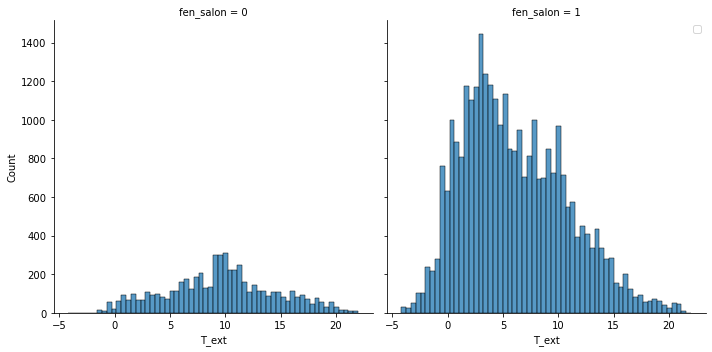

<Figure size 432x288 with 0 Axes>

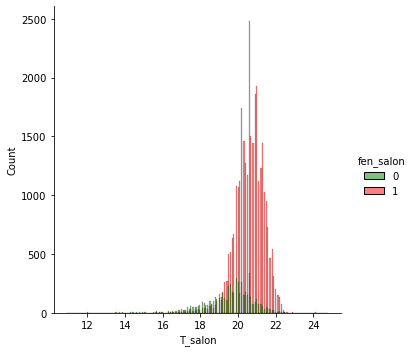

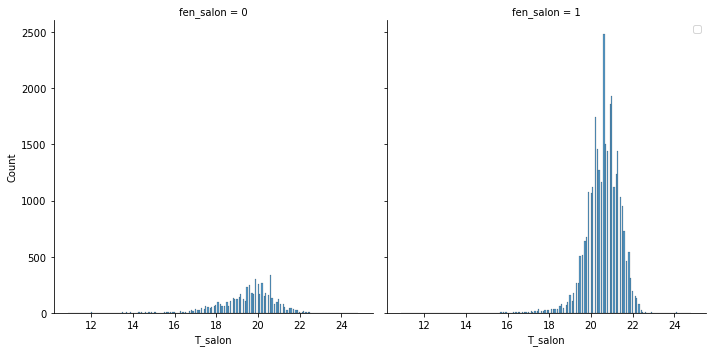

<Figure size 432x288 with 0 Axes>

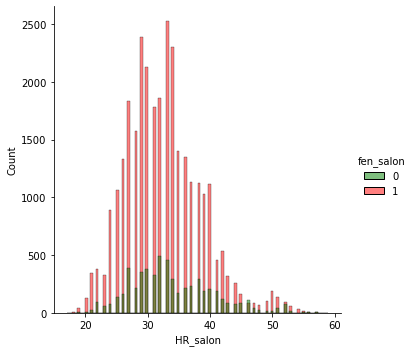

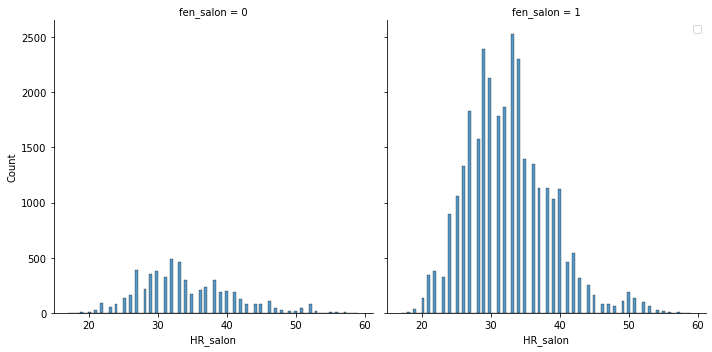

<Figure size 432x288 with 0 Axes>

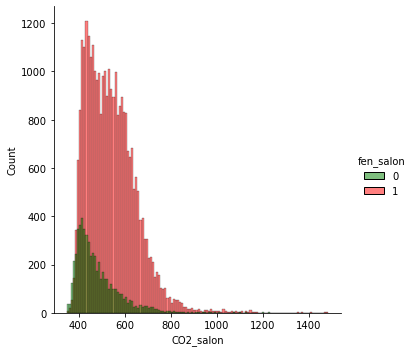

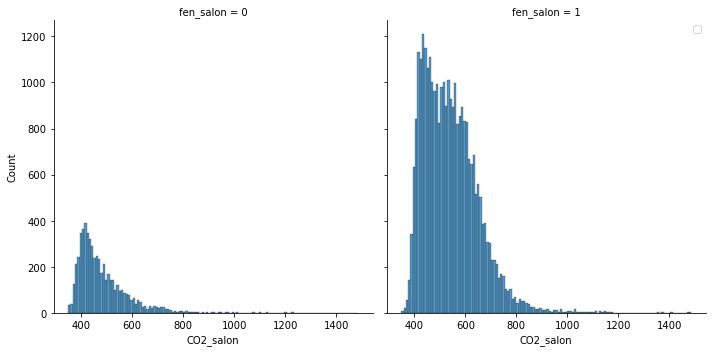

<Figure size 432x288 with 0 Axes>

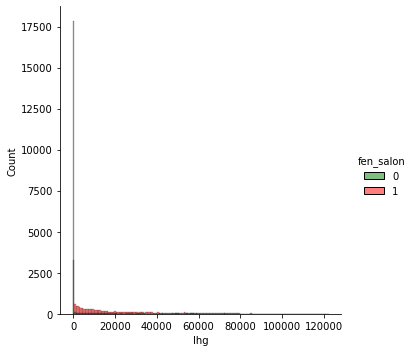

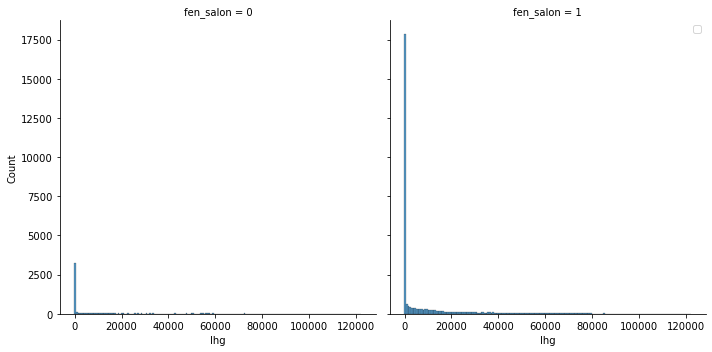

<Figure size 432x288 with 0 Axes>

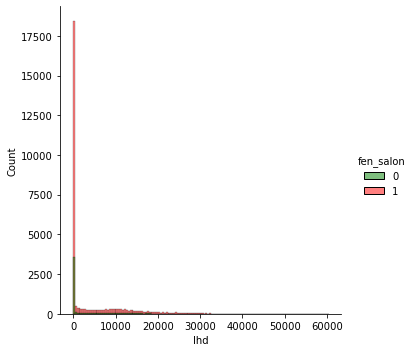

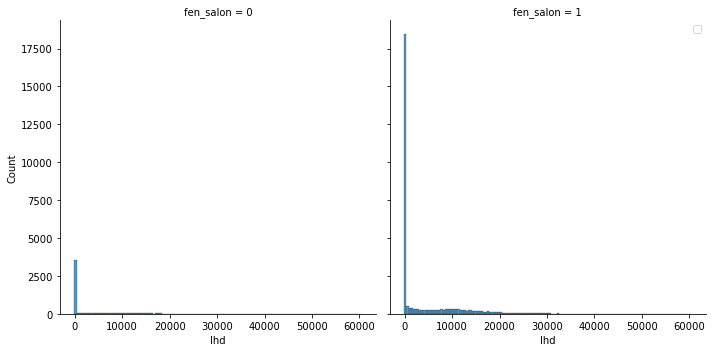

<Figure size 432x288 with 0 Axes>

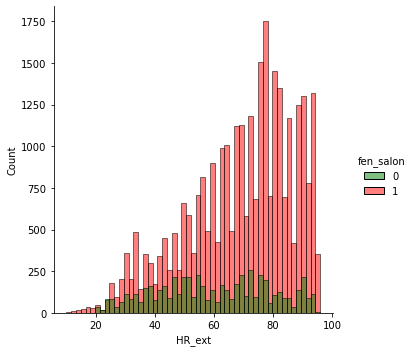

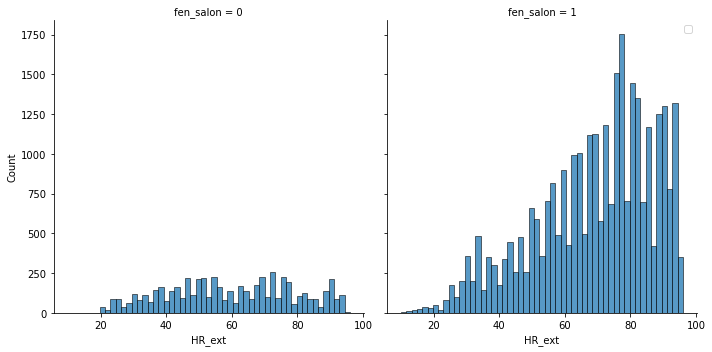

<Figure size 432x288 with 0 Axes>

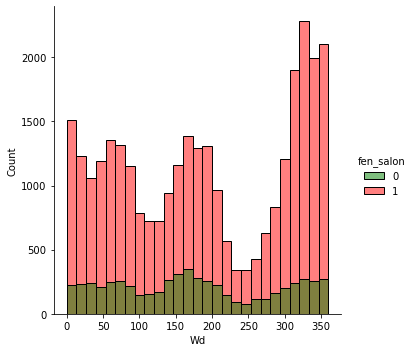

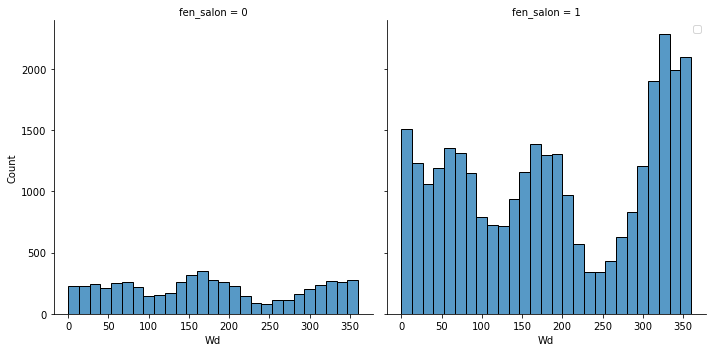

<Figure size 432x288 with 0 Axes>

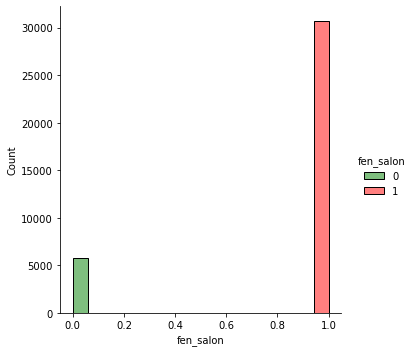

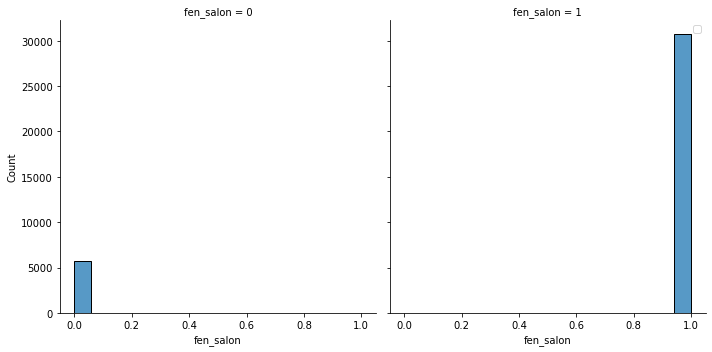

In [42]:
for col in dfs.select_dtypes('float'):
    plt.figure()
    sns.displot(data=dfs,x=col,hue="fen_salon",palette=["g","r"])
    sns.displot(data=dfs,x=col,col="fen_salon",palette=["g","r"])
    plt.legend()
for col in dfs.select_dtypes('int'):
    plt.figure()
    sns.displot(data=dfs,x=col,hue="fen_salon",palette=["g","r"])
    sns.displot(data=dfs,x=col,col="fen_salon",palette=["g","r"])
    plt.legend()    
    

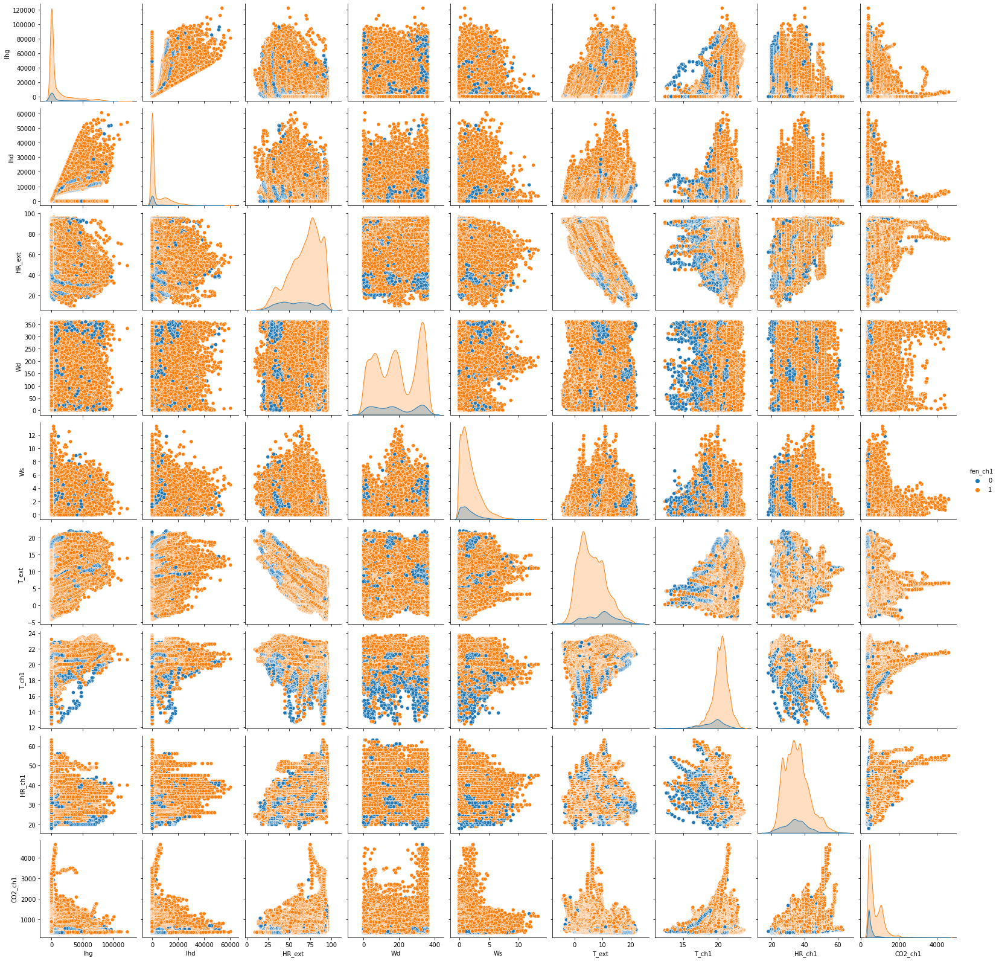

In [43]:
#CHAMBRE 1 
sns.pairplot(df1, hue="fen_ch1")

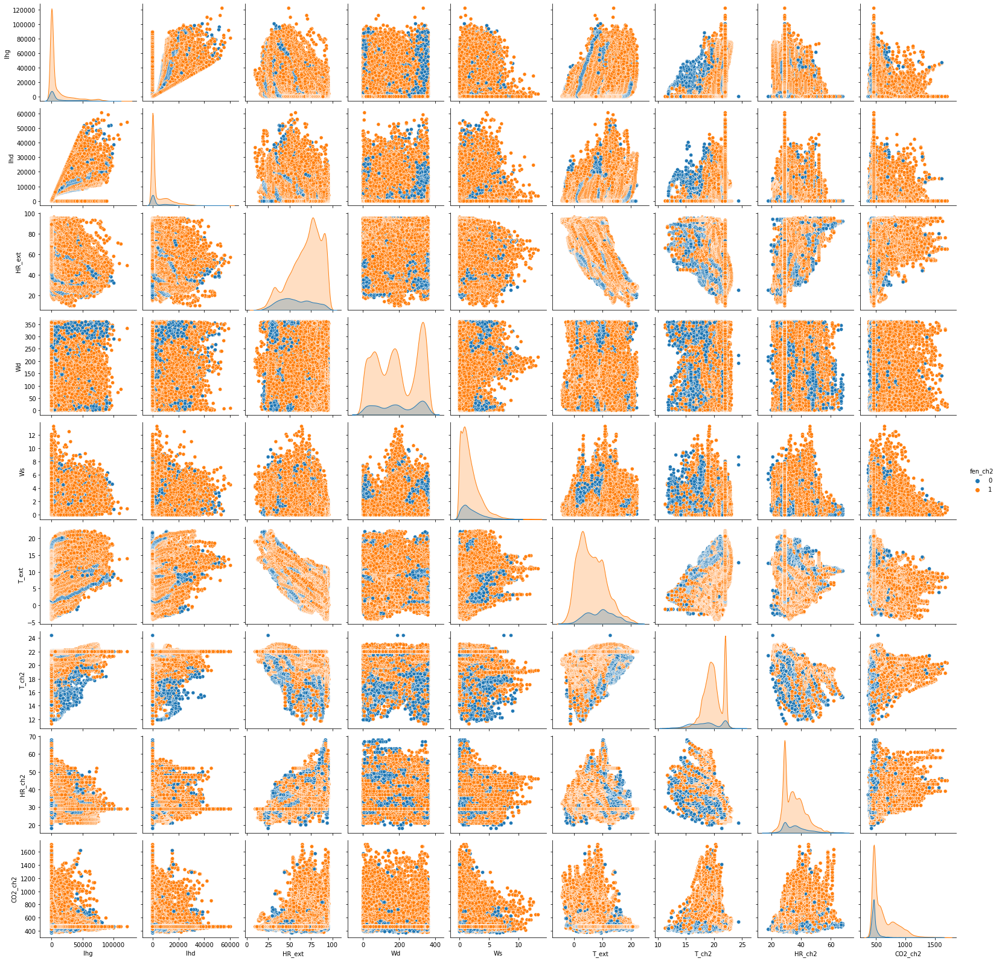

In [44]:
#CHAMBRE 2
sns.pairplot(df2, hue="fen_ch2")

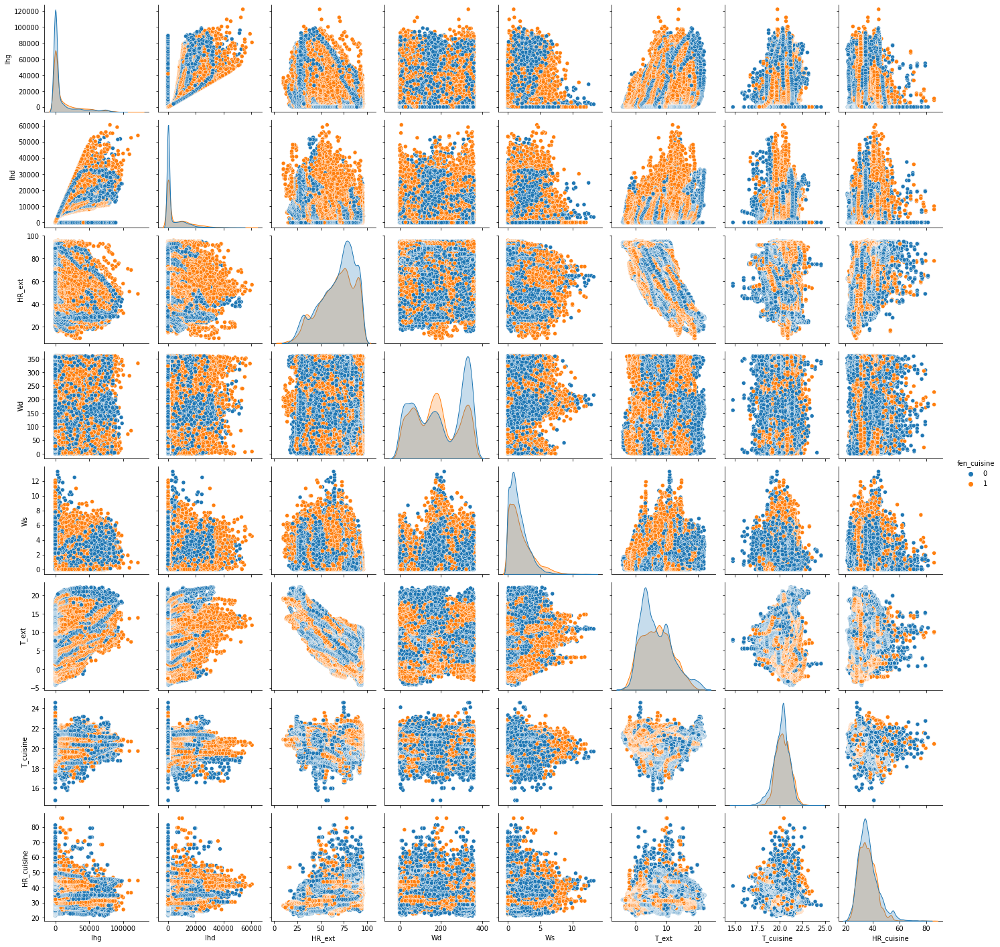

In [45]:
#cuisine
sns.pairplot(dfc, hue="fen_cuisine")

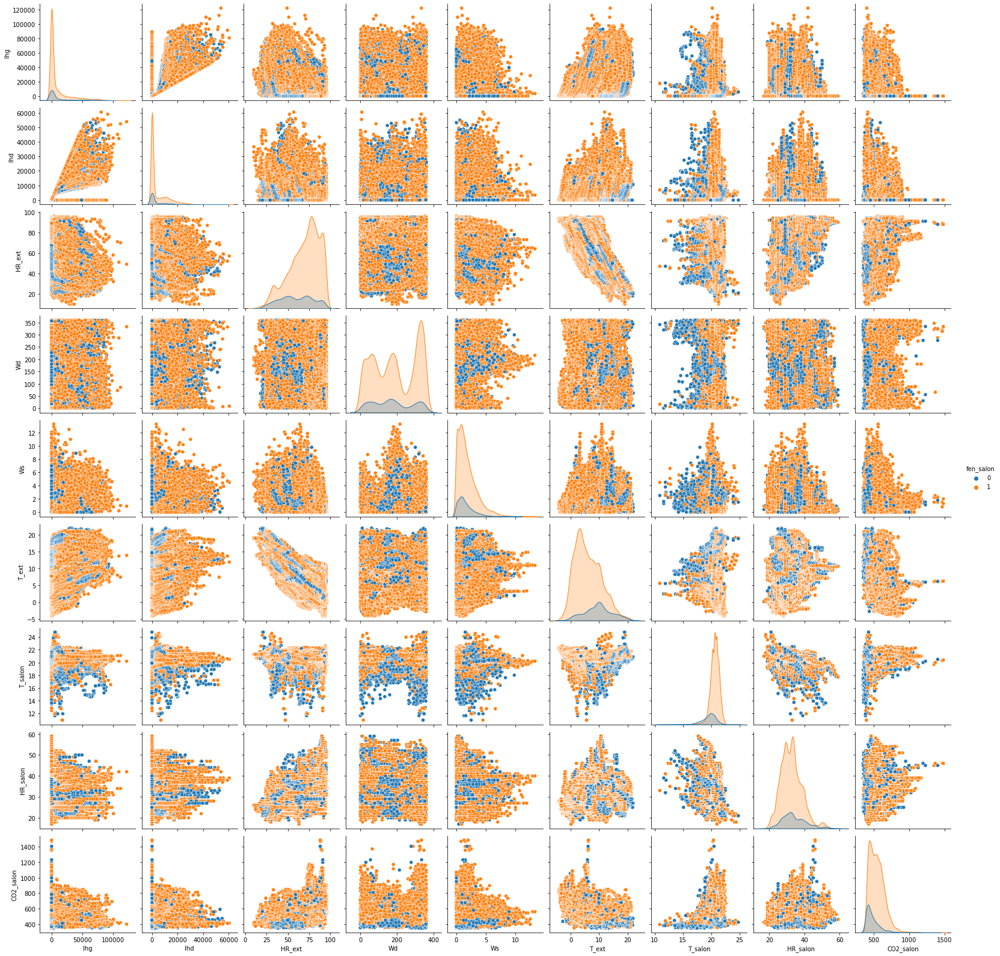

In [46]:
#salon
sns.pairplot(dfs, hue="fen_salon")

In [14]:
import dtale


In [15]:
dfn4=dtale.show(df)
dfn4

# Regroupé tout les données

In [62]:
dft=pd.concat([df,meteo1],axis=1)
dft.dropna(axis = 0, how = 'any',inplace=True)

In [63]:
dft

,fen_ch1,T_ch1,HR_ch1,CO2_ch1,fen_ch2,T_ch2,HR_ch2,CO2_ch2,fen_cuisine,T_cuisine,...,fen_salon,T_salon,HR_salon,CO2_salon,Ihg,Ihd,HR_ext,Wd,Ws,T_ext
Date,,,,,,,,,,,,,,,,,,,,,
2018-12-12 19:20:00,1.0,19.5,34.0,742.0,1.0,19.3,37.0,814.0,1.0,21.056,...,1.0,20.3,36.0,1006.0,0,0,88,345,2.0,-1.3
2018-12-12 19:25:00,1.0,19.5,34.0,742.0,1.0,19.3,37.0,814.0,1.0,21.056,...,1.0,20.3,36.0,1006.0,0,0,88,8,1.7,-1.4
2018-12-12 19:30:00,1.0,20.2,34.0,813.0,1.0,20.0,35.0,768.0,1.0,21.079,...,1.0,20.7,35.0,923.0,0,0,88,4,1.4,-1.4
2018-12-12 19:35:00,1.0,20.2,34.0,813.0,1.0,20.0,35.0,768.0,1.0,21.079,...,1.0,20.7,35.0,923.0,0,0,88,2,3.0,-1.5
2018-12-12 19:40:00,1.0,20.5,34.0,811.0,1.0,20.4,35.0,781.0,1.0,21.056,...,1.0,20.9,34.0,880.0,0,0,88,347,2.2,-1.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-04-18 08:35:00,1.0,20.1,43.0,835.0,1.0,22.0,29.0,461.0,1.0,19.389,...,1.0,20.0,40.0,519.0,42490,19418,52,159,2.5,14.0
2019-04-18 08:40:00,1.0,20.1,42.0,647.0,1.0,22.0,29.0,461.0,1.0,19.817,...,1.0,20.0,40.0,525.0,40900,18827,52,138,1.3,14.0
2019-04-18 08:45:00,1.0,20.1,42.0,647.0,1.0,22.0,29.0,461.0,0.0,19.817,...,1.0,20.0,40.0,525.0,46330,-99,51,195,1.4,14.4


In [64]:
#dft.to_excel('Quivogne Q1_N4_Regroupé.xlsx')

In [65]:
dft.groupby(['fen_ch1','fen_ch2','fen_cuisine','fen_salon']).count()

T_ch1  HR_ch1  CO2_ch1  T_ch2  HR_ch2  \
fen_ch1 fen_ch2 fen_cuisine fen_salon                                          
0.0     0.0     0.0         0.0          891     891      891    891     891   
                            1.0          714     714      714    714     714   
                1.0         0.0          231     231      231    231     231   
                            1.0          143     143      143    143     143   
        1.0     0.0         0.0          481     481      481    481     481   
                            1.0          993     993      993    993     993   
                1.0         0.0          193     193      193    193     193   
                            1.0          621     621      621    621     621   
1.0     0.0     0.0         0.0          905     905      905    905     905   
                            1.0         1370    1370     1370   1370    1370   
                1.0         0.0          335     335      335    335     335   
                            1.0          670     670      670    670     670   
        1.0     0.0         0.0         1636    1636     1636   1636    1636   
                            1.0        12713   12713    12713  12713   12713   
                1.0         0.0         1070    1070     1070   1070    1070   
                            1.0        13474   13474    13474  13474   13474   

                                       CO2_ch2  T_cuisine  HR_cuisine  \
fen_ch1 fen_ch2 fen_cuisine fen_salon                                   
0.0     0.0     0.0         0.0            891        891         891   
                            1.0            714        714         714   
                1.0         0.0            231        231         231   
                            1.0            143        143         143   
        1.0     0.0         0.0            481        481         481   
                            1.0            993        993         993   
                1.0         0.0            193        193         193   
                            1.0            621        621         621   
1.0     0.0     0.0         0.0            905        905         905   
                            1.0           1370       1370        1370   
                1.0         0.0            335        335         335   
                            1.0            670        670         670   
        1.0     0.0         0.0           1636       1636        1636   
                            1.0          12713      12713       12713   
                1.0         0.0           1070       1070        1070   
                            1.0          13474      13474       13474   

                                       T_salon  HR_salon  CO2_salon    Ihg  \
fen_ch1 fen_ch2 fen_cuisine fen_salon                                        
0.0     0.0     0.0         0.0            891       891        891    891   
                            1.0            714       714        714    714   
                1.0         0.0            231       231        231    231   
                            1.0            143       143        143    143   
        1.0     0.0         0.0            481       481        481    481   
                            1.0            993       993        993    993   
                1.0         0.0            193       193        193    193   
                            1.0            621       621        621    621   
1.0     0.0     0.0         0.0            905       905        905    905   
                            1.0           1370      1370       1370   1370   
                1.0         0.0            335       335        335    335   
                            1.0            670       670        670    670   
        1.0     0.0         0.0           1636      1636       1636   1636   
                            1.0          12713     12713      12713  12713   
                1.0         0.0    

In [66]:
#afficher les dates pour chaque cas 
z=dft.groupby(['fen_ch1','fen_ch2','fen_cuisine','fen_salon']).groups
import pprint as pprint
pprint.pprint(z)

{(0.0, 0.0, 0.0, 0.0): DatetimeIndex(['2018-12-13 09:00:00', '2018-12-13 09:05:00',
               '2018-12-15 16:50:00', '2018-12-15 16:55:00',
               '2018-12-15 17:05:00', '2018-12-15 17:10:00',
               '2018-12-15 17:15:00', '2018-12-15 17:20:00',
               '2018-12-15 17:25:00', '2018-12-15 17:30:00',
               ...
               '2019-04-17 19:50:00', '2019-04-17 19:55:00',
               '2019-04-17 20:00:00', '2019-04-17 20:05:00',
               '2019-04-17 20:10:00', '2019-04-17 20:15:00',
               '2019-04-17 20:20:00', '2019-04-17 20:25:00',
               '2019-04-17 20:30:00', '2019-04-17 20:35:00'],
              dtype='datetime64[ns]', name='Date', length=891, freq=None),
 (0.0, 0.0, 0.0, 1.0): DatetimeIndex(['2018-12-15 17:00:00', '2018-12-24 08:30:00',
               '2018-12-24 08:35:00', '2018-12-24 08:40:00',
               '2018-12-25 12:45:00', '2018-12-25 12:50:00',
               '2018-12-25 12:55:00', '2018-12-30 15:25:00',
     

# Ajouter une nouvel variable 

In [67]:
liste_de_condition=[
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#1------0-0-0-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#2------0-0-0-1
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#3------0-0-1-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1),#4------0-0-1-1
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#5------0-1-0-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#6------0-1-0-1
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#7------0-1-1-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1),#8------0-1-1-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#9------1-0-0-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#10-----1-0-0-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#11-----1-0-1-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1),#12-----1-0-1-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#13-----1-1-0-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#14-----1-1-0-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#15-----1-1-1-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1)]#16-----1-1-1-1
liste1=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16']    

dft['fenetre'] = np.select(liste_de_condition, liste1, default='Not Specified')
dft.drop(['fen_ch1','fen_ch2','fen_cuisine','fen_salon'],axis=1,inplace=True)
dft

,T_ch1,HR_ch1,CO2_ch1,T_ch2,HR_ch2,CO2_ch2,T_cuisine,HR_cuisine,T_salon,HR_salon,CO2_salon,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fenetre
Date,,,,,,,,,,,,,,,,,,
2018-12-12 19:20:00,19.5,34.0,742.0,19.3,37.0,814.0,21.056,35.480,20.3,36.0,1006.0,0,0,88,345,2.0,-1.3,16
2018-12-12 19:25:00,19.5,34.0,742.0,19.3,37.0,814.0,21.056,35.480,20.3,36.0,1006.0,0,0,88,8,1.7,-1.4,16
2018-12-12 19:30:00,20.2,34.0,813.0,20.0,35.0,768.0,21.079,35.614,20.7,35.0,923.0,0,0,88,4,1.4,-1.4,16
2018-12-12 19:35:00,20.2,34.0,813.0,20.0,35.0,768.0,21.079,35.614,20.7,35.0,923.0,0,0,88,2,3.0,-1.5,16
2018-12-12 19:40:00,20.5,34.0,811.0,20.4,35.0,781.0,21.056,35.875,20.9,34.0,880.0,0,0,88,347,2.2,-1.5,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-04-18 08:35:00,20.1,43.0,835.0,22.0,29.0,461.0,19.389,49.909,20.0,40.0,519.0,42490,19418,52,159,2.5,14.0,16
2019-04-18 08:40:00,20.1,42.0,647.0,22.0,29.0,461.0,19.817,48.928,20.0,40.0,525.0,40900,18827,52,138,1.3,14.0,16
2019-04-18 08:45:00,20.1,42.0,647.0,22.0,29.0,461.0,19.817,48.928,20.0,40.0,525.0,46330,-99,51,195,1.4,14.4,14


In [138]:
f=pd.DataFrame(dft['fenetre'].value_counts())#transformer en data frame 
f.sort_values(by='fenetre',inplace=True,ascending=False)
f['cas']=f.index
f.reset_index(inplace = True)
f['nombre de cas']=f['fenetre']
f['duré en minute']=f['nombre de cas']*5
f['duré en heure']=f['duré en minute']/60
f['cas']=f['cas'].astype(int)
#k=f['valeur'].to_numpy()
#k=list(map(int, k))
#liste=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
#l=[]
#for i in liste:
 #   for j in k:
    #    if(i==j):
     #       l.append(i)
#l
#f.sort_values(by='cas',inplace=True,ascending=True)
f.drop('fenetre',axis=1,inplace=True)
f.sort_values(by='cas',inplace=True,ascending=True)
f.reset_index(inplace = True)
f.drop('level_0',axis=1,inplace=True)
f.drop('index',axis=1,inplace=True)
f

,cas,nombre de cas,duré en minute,duré en heure
0,1,891,4455,74.250000
1,2,714,3570,59.500000
2,3,231,1155,19.250000
3,4,143,715,11.916667
4,5,481,2405,40.083333
5,6,993,4965,82.750000
6,7,193,965,16.083333
7,8,621,3105,51.750000
8,9,905,4525,75.416667
9,10,1370,6850,114.166667


In [139]:
r=pd.DataFrame({"cas" : [str(x + 1) for x in range(16)],
              "fen_ch1" : ["ouverte","ouverte","ouverte","ouverte","ouverte","ouverte","ouverte","ouverte","fermé","fermé","fermé","fermé","fermé","fermé","fermé","fermé"],
              "fen_ch2" : ["ouverte","ouverte","ouverte","ouverte","fermé","fermé","fermé","fermé","ouverte","ouverte","ouverte","ouverte","fermé","fermé","fermé","fermé"],
              "fen_cuisine" : ["ouverte","ouverte","fermé","fermé","ouverte","ouverte","fermé","fermé","ouverte","ouverte","fermé","fermé","ouverte","ouverte","fermé","fermé"],            
              "fen_salon":["ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé"],
              #"période":["2019-03-05 14:25:00--2019-03-05 14:50:00","2019-03-05 14:05:00--2019-03-05 14:20:00","" ,"" ,"2019-02-23 13:25:00--2019-02-23 15:10:00 & 2019-04-09 19:40:00 & 2019-04-13 11:05:00 ","" ,"" ,"" ,"" , "","" ,"" ,"" ,"" ,"" ,""]
              #"Cas détectés sur nos données Q1 N2":[np.where(liste==l, '✔', 'X')],
              "Cas détectés sur nos données":["✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔"]
             })

r

,cas,fen_ch1,fen_ch2,fen_cuisine,fen_salon,Cas détectés sur nos données
0,1,ouverte,ouverte,ouverte,ouverte,✔
1,2,ouverte,ouverte,ouverte,fermé,✔
2,3,ouverte,ouverte,fermé,ouverte,✔
3,4,ouverte,ouverte,fermé,fermé,✔
4,5,ouverte,fermé,ouverte,ouverte,✔
5,6,ouverte,fermé,ouverte,fermé,✔
6,7,ouverte,fermé,fermé,ouverte,✔
7,8,ouverte,fermé,fermé,fermé,✔
8,9,fermé,ouverte,ouverte,ouverte,✔
9,10,fermé,ouverte,ouverte,fermé,✔


In [142]:
#resum=pd.concat([r,f],ignore_index=True,axis=1,sort=False)
data = pd.concat([r, f], axis=1)
data = data.loc[:,~data.columns.duplicated()]
#data.drop('index',axis=1,inplace=True)
data


,cas,fen_ch1,fen_ch2,fen_cuisine,fen_salon,Cas détectés sur nos données,nombre de cas,duré en minute,duré en heure
0,1,ouverte,ouverte,ouverte,ouverte,✔,891,4455,74.250000
1,2,ouverte,ouverte,ouverte,fermé,✔,714,3570,59.500000
2,3,ouverte,ouverte,fermé,ouverte,✔,231,1155,19.250000
3,4,ouverte,ouverte,fermé,fermé,✔,143,715,11.916667
4,5,ouverte,fermé,ouverte,ouverte,✔,481,2405,40.083333
5,6,ouverte,fermé,ouverte,fermé,✔,993,4965,82.750000
6,7,ouverte,fermé,fermé,ouverte,✔,193,965,16.083333
7,8,ouverte,fermé,fermé,fermé,✔,621,3105,51.750000
8,9,fermé,ouverte,ouverte,ouverte,✔,905,4525,75.416667
9,10,fermé,ouverte,ouverte,fermé,✔,1370,6850,114.166667


In [25]:
#supprimé les valeurs manquantes 
dft.dropna(axis = 0, how = 'any',inplace=True)

In [26]:
#création variable/cible 
yt = dft['fenetre']
Xt = dft.drop(['fenetre','HR_ext','Ihd'], axis=1)

In [27]:
#Normaliser mes données 
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(Xt)
Xt_scaled=scaler.transform(Xt)
Xt_scaled=pd.DataFrame(Xt_scaled)
Xt_scaled.columns=Xt.columns
Xt_scaled


,T_ch1,HR_ch1,CO2_ch1,T_ch2,HR_ch2,CO2_ch2,T_cuisine,HR_cuisine,T_salon,HR_salon,CO2_salon,Ihg,Wd,Ws,T_ext
0,-0.523317,-0.124174,0.005879,-0.144511,0.218494,1.079182,0.983153,-0.123951,-0.132749,0.526313,4.360400,-0.543990,1.378784,0.138500,-1.618381
1,-0.523317,-0.124174,0.005879,-0.144511,0.218494,1.079182,0.983153,-0.123951,-0.132749,0.526313,4.360400,-0.543990,-1.562350,-0.047434,-1.638850
2,0.014944,-0.124174,0.180944,0.231761,-0.056292,0.846665,1.010514,-0.104591,0.270837,0.364382,3.595739,-0.543990,-1.597260,-0.233368,-1.638850
3,0.014944,-0.124174,0.180944,0.231761,-0.056292,0.846665,1.010514,-0.104591,0.270837,0.364382,3.595739,-0.543990,-1.614714,0.758280,-1.659318
4,0.245628,-0.124174,0.176013,0.446774,-0.056292,0.912377,0.983153,-0.066884,0.472629,0.202450,3.199589,-0.543990,1.396239,0.262456,-1.659318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36435,-0.061950,1.126646,0.235189,1.306826,-0.880650,-0.705134,-0.999937,1.960663,-0.435438,1.174040,-0.126227,1.637412,-0.244513,0.448390,1.513280
36436,-0.061950,0.987666,-0.228362,1.306826,-0.880650,-0.705134,-0.490781,1.818934,-0.435438,1.174040,-0.070950,1.555783,-0.427788,-0.295346,1.513280
36437,-0.061950,0.987666,-0.228362,1.306826,-0.880650,-0.705134,-0.490781,1.818934,-0.435438,1.174040,-0.070950,1.834555,0.069674,-0.233368,1.595154
36438,-0.369528,0.709706,-0.802870,1.306826,-0.880650,-0.705134,-0.546693,1.644987,-0.536335,1.174040,-0.752696,1.912591,-0.436515,-0.109412,1.615622


In [36]:
def evaluation(model):
    
    model.fit(X1_train, y1_train)
    ypred = model.predict(X1_test)
    
    print(confusion_matrix(y1_test, ypred))
    print(classification_report(y1_test, ypred))
    print('=======================================================')

variance expliqué pour chaque variable 
 [4.76110171 2.66283735 1.82755349 1.11660056 1.02657852 0.79933349
 0.6411145  0.50539333 0.44479613 0.37328221 0.30393044 0.26260909
 0.14614941 0.08462587 0.04450554]
ratio de la variance pour chaque variable 
 [0.31739807 0.17751762 0.12183356 0.07443799 0.06843669 0.05328744
 0.04273979 0.03369196 0.02965226 0.0248848  0.02026147 0.01750679
 0.00974303 0.00564157 0.00296695]


,composante,Variance expliquée,% variance expliquée,dimension,% cum. var. expliquée
0,composante1,4.761102,32.0,dim1,32.0
1,composante2,2.662837,18.0,dim2,49.0
2,composante3,1.827553,12.0,dim3,62.0
3,composante4,1.116601,7.0,dim4,69.0
4,composante5,1.026579,7.0,dim5,76.0
5,composante6,0.799333,5.0,dim6,81.0
6,composante7,0.641115,4.0,dim7,86.0
7,composante8,0.505393,3.0,dim8,89.0
8,composante9,0.444796,3.0,dim9,92.0
9,composante10,0.373282,2.0,dim10,94.0


<AxesSubplot:xlabel='dimension'>

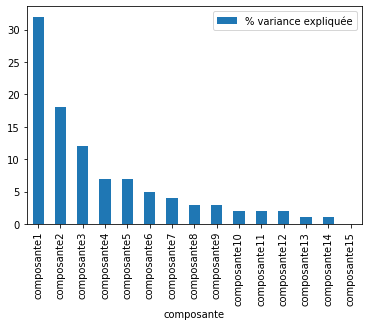

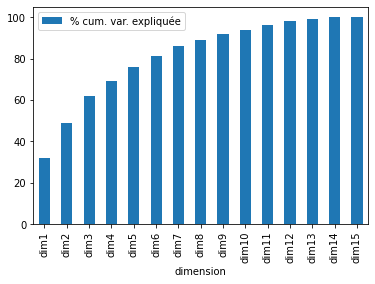

In [37]:
#ACP
from sklearn.decomposition import PCA
ACP1= PCA()
ACP1.fit(Xt_scaled)#entrainer l'acp sur Xt normalisé 
print('variance expliqué pour chaque variable \n',ACP1.explained_variance_)#imprimer la variance
print('ratio de la variance pour chaque variable \n',ACP1.explained_variance_ratio_)#imprimer le taux de la variance 
dt = pd.DataFrame(
    {
        "composante" : ["composante" + str(x + 1) for x in range(15)],
        
        "Variance expliquée" : ACP1.explained_variance_,
        
        "% variance expliquée" : np.round(ACP1.explained_variance_ratio_ * 100),
        "dimension":["dim"+ str(x + 1) for x in range(15)],
        "% cum. var. expliquée" : np.round(np.cumsum(ACP1.explained_variance_ratio_) * 100)
    }

)
display(dt)
dt.plot.bar(x = "composante" , y = "% variance expliquée")
dt.plot.bar(x = "dimension", y = "% cum. var. expliquée")


In [39]:
ACP1= PCA(n_components=10)
ACP1.fit(Xt_scaled)#entrainer l'acp 

Xt_acp=ACP1.transform(Xt_scaled)
datat=pd.DataFrame(Xt_acp)#transformer le tableu numpy to data frame 
datat.columns=['composante '+ str(x + 1) for x in range(10)]

In [40]:
X1_train, X1_test, y1_train, y1_test = train_test_split(datat, yt, test_size=0.3, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux de chaque cas  de fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux de chaque cas de  fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (25508, 10)
Test set: (10932, 10)


16    9441
14    8915
13    1122
10     961
15     758
6      679
9      648
1      619
2      489
12     449
8      447
5      347
11     228
3      165
7      139
4      101
Name: fenetre, dtype: int64

16    4033
14    3798
13     514
10     409
6      314
15     312
1      272
9      257
2      225
12     221
8      174
5      134
11     107
3       66
7       54
4       42
Name: fenetre, dtype: int64

taux de chaque cas  de fenetre pour le data set d entainement


16    0.370119
14    0.349498
13    0.043986
10    0.037674
15    0.029716
6     0.026619
9     0.025404
1     0.024267
2     0.019170
12    0.017602
8     0.017524
5     0.013604
11    0.008938
3     0.006469
7     0.005449
4     0.003960
Name: fenetre, dtype: float64

taux de chaque cas de  fenetre pour le data set Validation


16    0.368917
14    0.347420
13    0.047018
10    0.037413
6     0.028723
15    0.028540
1     0.024881
9     0.023509
2     0.020582
12    0.020216
8     0.015917
5     0.012258
11    0.009788
3     0.006037
7     0.004940
4     0.003842
Name: fenetre, dtype: float64

In [41]:
importance(evaluation,datat)

DecisionTreeClassifier
[[ 194    5    0    1   12   10    6    7   13    3    1    5    4    1
     2    8]
 [   7  258    3    9   10   46    3   27    9    0    0    4    5    0
     2   26]
 [   0    3   62    2    6    9    3    8    1    2    0    2    5    0
     0    4]
 [   4   13    3  144    4   17    3   15    4    2    0    2    4    0
     0    6]
 [   6   14    4    2  298   84   10   36    4    1    0   12   17    2
     2   22]
 [   6   75    1   14   89 3179   38  289   16    6    4    9   35    3
    16   18]
 [   1    4    0    3    7   16  184   65    4    4    0    3    5    3
     8    5]
 [  16   28    4   21   44  293   63 3454   20    5    2    8   21    9
    31   14]
 [  26    6    1    2    5   14    7   15  122    2    5    2    7    3
     2    6]
 [   4    1    1    2    1    4    2    6    5   34    3    0    1    0
     0    2]
 [   1    4    0    0    0    1    0    4    3    1   24    1    1    0
     1    1]
 [   7    1    2    0    1   18    7    9 

,importance
composante 1,0.141736
composante 5,0.127079
composante 8,0.120879
composante 3,0.111410
composante 2,0.107445
composante 10,0.098629
composante 9,0.086682
composante 7,0.075691
composante 4,0.068660
composante 6,0.061789


RandomForest
[[ 229    1    0    0    3    6    1    7   12    4    0    2    3    0
     0    4]
 [   1  303    1    2    3   57    2   13    5    0    0    0    0    0
     1   21]
 [   0    1   78    3    0   10    3    8    0    1    0    0    0    0
     0    3]
 [   0   15    3  174    1    6    0   20    0    1    0    0    0    0
     0    1]
 [   1    1    1    0  344  103    5   39    0    0    0    7    1    0
     1   11]
 [   3   23    0    1   23 3595    5  134    3    0    0    2    8    0
     0    1]
 [   2    0    0    1    5   24  216   60    0    1    0    1    0    1
     1    0]
 [   2    7    0    7    4  149   12 3840    1    1    0    2    1    1
     5    1]
 [  15    8    1    0    1   11    1   10  163    1    1    2    9    0
     1    1]
 [   5    1    2    1    0    2    1    3    1   47    3    0    0    0
     0    0]
 [   1    0    0    4    0    3    0    1    3    1   28    0    0    0
     1    0]
 [   4    0    0    0    3   15    0    8    1    0 

,importance
composante 5,0.125193
composante 1,0.123410
composante 8,0.116946
composante 2,0.115907
composante 3,0.108738
composante 10,0.095529
composante 9,0.087312
composante 7,0.080918
composante 6,0.073419
composante 4,0.072628


AdaBoost
[[ 127    1    5    5    8   21    0   54   24    9    0    7    3    0
     0    8]
 [  32  109    7    2   10  111    0   71   32    0    0    1    0    0
     0   34]
 [   3    0    4   15   10   12    0   36    2    0    0    0    0    0
     0   25]
 [   2   30    4   19    2   78    0   77    4    0    1    1    0    0
     0    3]
 [  24   11   25    2   57  146    0  177    7    7    0    6    6    1
     4   41]
 [  24   58   50   17   27 1856    0 1582   46    6    8   14   48   12
    16   34]
 [   8   23    2    1    6   62    4  171   10    5    0    3    3    1
     0   13]
 [  34   17   15    7   46  941    1 2851   22   28    8    8    6   13
    21   15]
 [  32    7   14    2    2   16    0   80   33    6    1    3   10    3
     0   16]
 [  20    0    0    1    0    3    0    8    1   19    0    1    0    0
     0   13]
 [   2    1    1    1    1    6    0   17    9    0    0    1    1    0
     1    1]
 [  20    0    0    0    3   23    0   42    0    3    0

,importance
composante 8,0.18
composante 1,0.14
composante 4,0.12
composante 2,0.10
composante 3,0.10
composante 10,0.10
composante 5,0.08
composante 9,0.08
composante 7,0.06
composante 6,0.04


XGboost
[16:22:52] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 216    2    0    0    3   11    3   14   15    0    0    2    3    0
     0    3]
 [   3  286    2    7    4   58    1   19    8    0    0    0    0    0
     1   20]
 [   0    3   69    0    2   10    2   18    0    0    0    0    0    0
     0    3]
 [   0   20    4  163    1   10    0   20    0    0    0    0    0    0
     1    2]
 [   2    2    0    0  314  121    6   48    0    0    0    5    1    0
     1   14]
 [   5   20    0    2   30 3458    4  259    3    0    0    0   11    1
     1    4]
 [   2    0    2    1    6   25  192   76    1    1    0    3    2    0
     1    0]
 [   5   10    0    5    5  209   15 3765    0    1    0    2    5    0
     4    7]
 [  12    9    0    0    2   15    2   18  152    1    1   

,importance
composante 2,0.134219
composante 8,0.129853
composante 5,0.127100
composante 1,0.102013
composante 3,0.096014
composante 10,0.090757
composante 9,0.086996
composante 6,0.083986
composante 4,0.074575
composante 7,0.074486


Regression_logistic
[[ 152    3    0    0    6   10    0   65    8    3    0   14    3    0
     0    8]
 [  18  165    2    1    4   88    0  111   11    0    0    1    2    0
     0    6]
 [   3    6   13    0    1   17    0   42    0    1    0    0    0    0
     0   24]
 [   0   31    5    8    0   75    0   98    2    0    0    0    0    0
     0    2]
 [  21   11    0    0   65  149    0  237    4    1    0    4    4    0
     0   18]
 [  15   32    0    0   16 2263    0 1405   18    0    0   13   15    6
     8    7]
 [  10    2    0    0   10   96    0  180    4    0    0    3    1    0
     1    5]
 [  33   13    0    0    9 1266    0 2687   11    0    0    2    3    0
     7    2]
 [  48   18    0    0    4   22    0   87   26    1    0    9    5    0
     0    5]
 [  14    0    0    2    1    4    0   18    1   17    0    0    0    0
     0    9]
 [   2    4    0    3    0   12    0   11    7    1    0    0    1    0
     1    0]
 [  29    0    0    0    0   12    0   57    

In [42]:
X1_train, X1_test, y1_train, y1_test = train_test_split(Xt_scaled, yt, test_size=0.3, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux de chaque cas  de fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux de chaque cas de  fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (25508, 15)
Test set: (10932, 15)


16    9441
14    8915
13    1122
10     961
15     758
6      679
9      648
1      619
2      489
12     449
8      447
5      347
11     228
3      165
7      139
4      101
Name: fenetre, dtype: int64

16    4033
14    3798
13     514
10     409
6      314
15     312
1      272
9      257
2      225
12     221
8      174
5      134
11     107
3       66
7       54
4       42
Name: fenetre, dtype: int64

taux de chaque cas  de fenetre pour le data set d entainement


16    0.370119
14    0.349498
13    0.043986
10    0.037674
15    0.029716
6     0.026619
9     0.025404
1     0.024267
2     0.019170
12    0.017602
8     0.017524
5     0.013604
11    0.008938
3     0.006469
7     0.005449
4     0.003960
Name: fenetre, dtype: float64

taux de chaque cas de  fenetre pour le data set Validation


16    0.368917
14    0.347420
13    0.047018
10    0.037413
6     0.028723
15    0.028540
1     0.024881
9     0.023509
2     0.020582
12    0.020216
8     0.015917
5     0.012258
11    0.009788
3     0.006037
7     0.004940
4     0.003842
Name: fenetre, dtype: float64

In [43]:
importance(evaluation,Xt_scaled)

DecisionTreeClassifier
[[ 208    4    1    1    4    6    4    4   14    9    0    3    1    2
     1   10]
 [   2  296    3    4    9   33    1    7   11    1    3    3    2    0
     0   34]
 [   0    0   67    9    0    4    7    8    0    5    0    1    1    0
     0    5]
 [   0   15    3  167    1    6    4   13    0    1    0    0    1    0
     3    7]
 [   3    2    2    0  372   68   17   19    0    0    0    7    6    0
     3   15]
 [   7   35    0    8   77 3451   12  130   11    1    5    9   37    0
    10    5]
 [   5    2    4    1   13   13  227   31    2    1    0    2    3    3
     4    1]
 [   5   11   11    6   10  147   71 3697    6   11    4    6   16    4
    21    7]
 [  14    8    1    0    4    2    1    3  174    1    3    3    6    1
     0    4]
 [  11    0    2    0    1    2    1    2    0   44    3    0    0    0
     0    0]
 [   3    0    0    3    0    0    0    1    3    0   29    0    0    0
     2    1]
 [   1    0    0    0    5    9    2    7 

,importance
CO2_ch1,0.111210
T_ext,0.109245
CO2_ch2,0.088360
T_salon,0.084760
T_ch2,0.076584
T_ch1,0.072935
T_cuisine,0.070624
CO2_salon,0.061545
HR_cuisine,0.055652
Ihg,0.054699


RandomForest
[[ 239    1    0    0    1    5    0    0   18    3    0    1    1    0
     0    3]
 [   1  341    1    1    0   24    1    4    5    0    0    1    1    0
     1   28]
 [   0    0   79    7    0    0    3    9    0    3    0    1    0    0
     0    5]
 [   0    8    2  199    0    2    1    9    0    0    0    0    0    0
     0    0]
 [   0    1    1    0  395   79   10   11    0    0    0    7    2    0
     0    8]
 [   2   12    0    0   31 3682    5   46    1    0    0    5   14    0
     0    0]
 [   0    1    1    0    8    7  245   40    0    0    0    2    1    5
     1    1]
 [   0    0    1    5    0   61   21 3929    0    3    0    2    1    1
     9    0]
 [  19    5    0    0    0    2    0    4  186    1    3    1    3    0
     0    1]
 [   6    0    2    1    0    1    0    3    0   50    3    0    0    0
     0    0]
 [   0    0    0    4    0    1    0    1    4    0   32    0    0    0
     0    0]
 [   2    0    0    0    3   10    0    4    0    0 

,importance
CO2_ch1,0.101534
T_ext,0.095192
T_salon,0.078147
CO2_ch2,0.076523
T_ch2,0.075162
T_cuisine,0.071469
T_ch1,0.070778
HR_cuisine,0.069841
CO2_salon,0.060155
HR_ch1,0.059320


AdaBoost
[[  79    9    0    1    6   46    0   52   38   13    2   13    4    2
     3    4]
 [  20  128    6   21    3  107    0   61   23    0    0    1    1    0
     1   37]
 [   1    2   19    0    6   22    0   31    3    4    0    1    0    0
     0   18]
 [   7   17    3   15    1  116    1   52    1    0    0    0    0    0
     0    8]
 [  19   20    7    2   50  160    1  198    8    3    0    5    0    1
     1   39]
 [  21   84   56   23   20 2410    0 1092   16    3    5    8    1    0
    16   43]
 [  15    5    4    1   14   68    3  155    1    7    0    0    0    1
     1   37]
 [  41   22   21   13   10 1485    1 2381   13    9    0    7    7    1
    16    6]
 [  18    6    0    2    3   32    0   71   51    1    9    7    2    1
    10   12]
 [  22    8    1    1    0    3    0   17    1    6    1    4    0    0
     0    2]
 [   2    0    0    0    0   12    0   13   10    1    2    0    0    0
     2    0]
 [  24    1    7    0    2   31    0   43    1    1    0

,importance
T_ch1,0.16
T_ext,0.12
CO2_ch1,0.10
CO2_ch2,0.08
T_cuisine,0.08
T_salon,0.08
T_ch2,0.06
CO2_salon,0.06
Ihg,0.06
HR_cuisine,0.04


XGboost
[16:25:42] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 236    1    0    2    1    3    0    1   15    7    0    1    1    0
     0    4]
 [   0  337    1    1    1   27    0    3    5    0    0    0    2    0
     0   32]
 [   0    0   82    7    0    5    3    5    0    2    0    0    0    0
     0    3]
 [   0    6    2  200    0    2    1    9    0    1    0    0    0    0
     0    0]
 [   1    2    1    0  390   81    5   17    0    0    0    7    2    0
     0    8]
 [   2   10    0    0   23 3659    5   78    2    0    0    3   16    0
     0    0]
 [   0    0    1    0   10    9  243   39    0    0    0    3    0    4
     1    2]
 [   1    5    1    2    1   76   17 3916    2    0    0    3    1    2
     6    0]
 [  18    4    0    0    0    4    0    1  191    1    3   

,importance
T_salon,0.096411
T_ch2,0.095781
CO2_ch1,0.093549
T_ch1,0.082586
HR_ch2,0.079473
T_ext,0.075250
CO2_ch2,0.073717
HR_salon,0.073471
Ihg,0.059166
HR_ch1,0.059055


Regression_logistic
[[ 161    1    0    1    8    5    0   49   15    4    0    5    2    8
     1   12]
 [  22  166    0    2    4   89    0   97    9    1    0    0    0    0
     0   19]
 [   8    4   17    0    1   11    0   39    0    2    0    0    0    0
     0   25]
 [   0   39    2   19    0   53    0  103    1    0    0    0    0    0
     0    4]
 [  16   14    0    1   80  153    2  200    5    0    0    6    6    2
     0   29]
 [  14   32    1   18   19 2326    2 1305   19    0    0   17   24    3
     8   10]
 [  10    3    0    1   25   71    1  182    2    0    0    2    9    0
     1    5]
 [  32   11    2    4   18 1180    5 2740   16    0    0    0    7    4
     8    6]
 [  45   13    0    8   10   32    2   56   31    0    0    7   10    0
     0   11]
 [  16    0    0    2    0    6    0   11    1   22    0    0    1    0
     0    7]
 [   4    4    0    1    0    4    0   23    3    1    0    0    0    0
     2    0]
 [  25    0    0    0    2   12    2   61    

# Heure

In [ ]:
pd.to_datetime(df1['Date'], format='%m/%d/%y')
df1=df1.set_index('Date')
df1_avec_date=df1.copy()
#df1=df1.loc['date début':'date fin']# si ya une anomalie dans les données en peu selection les dates quand veu prendre 
df1_avec_date['jour'] = df1_avec_date.index.weekday#day_name()
df1_avec_date['heure'] = df1_avec_date.index.hour
df1_avec_date['mois'] = df1_avec_date.index.month
#df1['nom de la journé']=df1.index.day_name()

#================== Chambre 2 ====================#

pd.to_datetime(df2['Date'], format='%m/%d/%y')
df2=df2.set_index('Date')
df2_avec_date=df2.copy()
df2_avec_date=df2_avec_date.loc['2018-12-12 19:00:00':'2019-03-25 12:00:00']
df2_avec_date['jour'] = df2_avec_date.index.weekday#day_name()
df2_avec_date['heure'] = df2_avec_date.index.hour
df2_avec_date['mois'] = df2_avec_date.index.month

#=================== Cuisine =====================#

pd.to_datetime(dfc['Date'], format='%m/%d/%y')
dfc=dfc.set_index('Date')
dfc_avec_date=dfc.copy()
#dfc=dfc.loc['':'']
dfc_avec_date['jour'] = dfc_avec_date.index.weekday#day_name()
dfc_avec_date['heure'] = dfc_avec_date.index.hour
dfc_avec_date['mois'] = dfc_avec_date.index.month
#==================== salon ======================#

pd.to_datetime(dfs['Date'], format='%m/%d/%y')
dfs=dfs.set_index('Date')
dfs_avec_date=dfs.copy()
#dfs=dfs.loc['':'']
dfs_avec_date['jour'] = dfs_avec_date.index.weekday#day_name()
dfs_avec_date['heure'] = dfs_avec_date.index.hour
dfs_avec_date['mois'] = dfs_avec_date.index.month

In [12]:
r=dfc.loc['2018-12-23 02:30:00':'2019-01-22 19:00:00']
r

,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_cuisine,T_cuisine,HR_cuisine
Date,,,,,,,,,
2018-12-23 02:30:00,0,0,94,45,0.8,8.8,0,19.318,58.821
2018-12-23 02:35:00,0,0,94,78,0.8,8.7,0,19.318,58.821
2018-12-23 02:40:00,0,0,94,42,1.4,8.7,0,19.103,58.027
2018-12-23 02:45:00,0,0,94,35,1.3,8.7,0,19.103,58.027
2018-12-23 02:50:00,0,0,94,66,1.0,8.6,0,19.151,57.302
...,...,...,...,...,...,...,...,...,...
2019-01-22 18:40:00,0,0,68,67,0.5,1.6,0,21.199,27.463
2019-01-22 18:45:00,0,0,69,62,0.8,1.5,0,21.199,27.463
2019-01-22 18:50:00,0,0,69,58,0.8,1.5,0,21.127,28.131


In [39]:
r['T_ext'].mean()

3.345299241995711

In [ ]:

#supprimé les valeurs manquantes pour tout les fenetres 
df1.dropna(axis = 0, how = 'any',inplace=True)
df2.dropna(axis = 0, how = 'any',inplace=True)
dfc.dropna(axis = 0, how = 'any',inplace=True)
dfs.dropna(axis = 0, how = 'any',inplace=True)
df1_avec_date.dropna(axis = 0, how = 'any',inplace=True)
df2_avec_date.dropna(axis = 0, how = 'any',inplace=True)
dfc_avec_date.dropna(axis = 0, how = 'any',inplace=True)
dfs_avec_date.dropna(axis = 0, how = 'any',inplace=True)





In [37]:
y1 = df1['fen_ch1']
X1 = df1.drop(['fen_ch1'], axis=1)
#===============#
y2 = df2['fen_ch2']
X2 = df2.drop(['fen_ch2'], axis=1)
#===============#
yc = dfc['fen_cuisine']
Xc = dfc.drop(['fen_cuisine'], axis=1)
#===============#
ys = dfs['fen_salon']
Xs = dfs.drop(['fen_salon'], axis=1)

In [38]:
from sklearn.preprocessing import StandardScaler
#=======================================#
scaler1=StandardScaler()
scaler1.fit(X1)
X1_scaled=scaler1.transform(X1)
X1_scaled=pd.DataFrame(X1_scaled)
#=======================================#
scaler2=StandardScaler()
scaler2.fit(X2)
X2_scaled=scaler2.transform(X2)
X2_scaled=pd.DataFrame(X2_scaled)
#=======================================#
scaler_c=StandardScaler()
scaler_c.fit(Xc)
Xc_scaled=scaler_c.transform(Xc)
Xc_scaled=pd.DataFrame(Xc_scaled)
#=======================================#
scaler_s=StandardScaler()
scaler_s.fit(Xs)
Xs_scaled=scaler_s.transform(Xs)
Xs_scaled=pd.DataFrame(Xs_scaled)
#=======================================#

# ACP chambre 1 + le model

variance expliqué pour chaque variable 
 [3.07960866 1.35003801 1.28692529 1.02972445 0.84662967 0.69689774
 0.37161206 0.27658294 0.06222816]
ratio de la variance pour chaque variable 
 [0.34216935 0.15000011 0.14298777 0.11441069 0.09406738 0.07743096
 0.0412891  0.03073059 0.00691405]


,composante,Variance expliquée,% variance expliquée,dimension,% cum. var. expliquée
0,composante1,3.079609,34.0,dim1,34.0
1,composante2,1.350038,15.0,dim2,49.0
2,composante3,1.286925,14.0,dim3,64.0
3,composante4,1.029724,11.0,dim4,75.0
4,composante5,0.846630,9.0,dim5,84.0
5,composante6,0.696898,8.0,dim6,92.0
6,composante7,0.371612,4.0,dim7,96.0
7,composante8,0.276583,3.0,dim8,99.0
8,composante9,0.062228,1.0,dim9,100.0


<AxesSubplot:xlabel='dimension'>

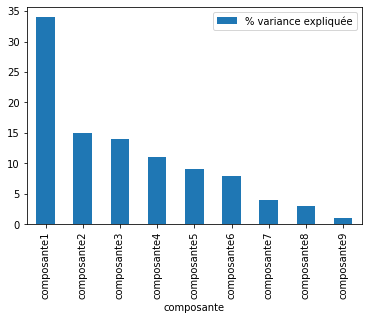

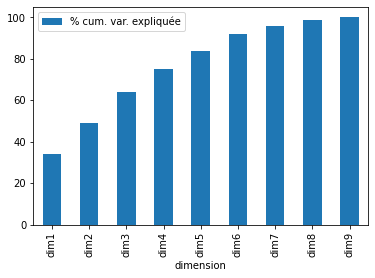

In [39]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score,confusion_matrix,classification_report
from sklearn.model_selection import learning_curve
from sklearn.decomposition import PCA
ACP1= PCA()
ACP1.fit(X1_scaled)#entrainer l'acp sur X1 normalisé 
print('variance expliqué pour chaque variable \n',ACP1.explained_variance_)#imprimer la variance
print('ratio de la variance pour chaque variable \n',ACP1.explained_variance_ratio_)#imprimer le taux de la variance 
d1 = pd.DataFrame(
    {
        "composante" : ["composante" + str(x + 1) for x in range(9)],
        
        "Variance expliquée" : ACP1.explained_variance_,
        
        "% variance expliquée" : np.round(ACP1.explained_variance_ratio_ * 100),
        "dimension":["dim"+ str(x + 1) for x in range(9)],
        "% cum. var. expliquée" : np.round(np.cumsum(ACP1.explained_variance_ratio_) * 100)
    }

)
display(d1)
d1.plot.bar(x = "composante" , y = "% variance expliquée")
d1.plot.bar(x = "dimension", y = "% cum. var. expliquée")


In [40]:
pd.DataFrame({"Noms des variables" : X1.columns, "Composante 1" : ACP1.components_[0], "Composante 2" : ACP1.components_[1],
             "Composante 3" : ACP1.components_[2],"Composante 4" : ACP1.components_[3],"Composante 5" : ACP1.components_[4]
             ,"Composante 6" : ACP1.components_[5],"Composante 7" : ACP1.components_[6],"Composante 8" : ACP1.components_[7],"Composante 9" : ACP1.components_[8]})

,Noms des variables,Composante 1,Composante 2,Composante 3,Composante 4,Composante 5,Composante 6,Composante 7,Composante 8,Composante 9
0,Ihg,0.450101,-0.241482,0.206027,0.042634,0.274543,-0.098534,0.135354,0.768848,-0.017338
1,Ihd,0.376685,-0.169378,0.260391,0.035172,0.626751,-0.016693,0.123605,-0.593274,-0.005584
2,HR_ext,-0.482639,-0.158985,0.022068,-0.001507,0.435963,0.040604,-0.393581,0.131749,-0.614262
3,Wd,0.046939,0.407060,-0.296515,0.636881,0.173834,-0.552419,-0.026684,0.015275,-0.047219
4,Ws,0.242891,0.481202,-0.025656,0.273727,0.119821,0.757402,-0.191089,0.087645,-0.040641
5,T_ext,0.389935,0.232973,0.417393,-0.103094,-0.425999,-0.217304,-0.181196,-0.118089,-0.577370
6,T_ch1,0.238391,-0.580189,-0.130255,0.398713,-0.252436,0.056800,-0.579125,-0.106688,0.129976
7,HR_ch1,-0.277266,0.208656,0.690124,0.087457,0.071291,-0.138344,-0.367918,0.070498,0.480740
8,CO2_ch1,-0.274993,-0.236716,0.365006,0.582366,-0.216539,0.199879,0.520276,-0.036463,-0.192633


In [55]:
ACP1= PCA(n_components=9)
ACP1.fit(X1_scaled)#entrainer l'acp 

X1_acp=ACP1.transform(X1_scaled)
data1_7=pd.DataFrame(X1_acp)#transformer le tableu numpy to data frame 
data1_7.columns=['var '+ str(x + 1) for x in range(9)]
display(data1_7)#afficher le dataset issu de l'acp avec 7 composante principale (96% de la var expliqué)
#display(data1_7.corr())#Viréfier la corélation des variables 

,var 1,var 2,var 3,var 4,var 5,var 6,var 7,var 8,var 9
0,-1.625359,0.580086,-1.342133,0.821519,1.039150,-0.207964,-0.001545,0.344234,0.064085
1,-1.816558,-0.711390,-0.473805,-1.100444,0.514315,1.280417,0.116175,0.285430,0.222340
2,-1.783183,-1.168807,-0.464895,-0.857009,0.312182,1.224439,-0.068003,0.204791,0.267783
3,-1.551119,-0.703495,-0.493704,-0.594572,0.436689,1.989612,-0.253323,0.293855,0.240123
4,-1.473869,0.150895,-1.405635,1.276456,0.843525,-0.037144,-0.375080,0.271958,0.149030
...,...,...,...,...,...,...,...,...,...
36436,2.076539,-0.222695,2.156060,-0.447911,0.600388,-0.720386,0.118454,-0.139357,0.149836
36437,1.377836,0.384031,1.460903,-0.196561,-0.819689,-0.954916,-0.164511,1.521294,0.118742
36438,1.641456,0.497277,1.268575,-0.965158,-0.745261,-0.691795,-0.143587,1.601857,0.128239
36439,1.606632,0.488017,1.215176,-0.846278,-0.703890,-1.054933,-0.126398,1.624086,0.066462


In [60]:
from sklearn.model_selection import train_test_split
X1_train, X1_test, y1_train, y1_test = train_test_split(data1_7, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
#afficher le nombre de fois ou la fenetre elle est ouverte pour notre train et test set 
display(y_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y_test.value_counts(normalize=True))

Train set: (29152, 9)
Test set: (7289, 9)


1    25670
0     3482
Name: fen_ch1, dtype: int64

1    6504
0     785
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.880557
0    0.119443
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.892303
0    0.107697
Name: fen_ch1, dtype: float64

In [61]:
importance(evaluation,data1_7)

RandomForest
[[ 618  237]
 [  53 6381]]
              precision    recall  f1-score   support

           0       0.92      0.72      0.81       855
           1       0.96      0.99      0.98      6434

    accuracy                           0.96      7289
   macro avg       0.94      0.86      0.89      7289
weighted avg       0.96      0.96      0.96      7289



,importance
var 4,0.182029
var 2,0.138739
var 7,0.112454
var 3,0.100013
var 1,0.099242
var 9,0.097395
var 5,0.096049
var 6,0.091211
var 8,0.082869


In [166]:
# en ajoutant le jour et l'heure le recall augmente de 4 % sur la détectoin de l'ouverture 

In [47]:
X1

,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,T_ch1,HR_ch1,CO2_ch1
Date,,,,,,,,,
2018-12-12 19:20:00,0,0,88,345,2.0,-1.3,19.5,34.0,742.0
2018-12-12 19:25:00,0,0,88,8,1.7,-1.4,19.5,34.0,742.0
2018-12-12 19:30:00,0,0,88,4,1.4,-1.4,20.2,34.0,813.0
2018-12-12 19:35:00,0,0,88,2,3.0,-1.5,20.2,34.0,813.0
2018-12-12 19:40:00,0,0,88,347,2.2,-1.5,20.5,34.0,811.0
...,...,...,...,...,...,...,...,...,...
2019-04-18 08:40:00,40900,18827,52,138,1.3,14.0,20.1,42.0,647.0
2019-04-18 08:45:00,46330,-99,51,195,1.4,14.4,20.1,42.0,647.0
2019-04-18 08:50:00,47850,-99,49,137,1.6,14.5,19.7,40.0,414.0


In [58]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (29152, 9)
Test set: (7289, 9)


1    25740
0     3412
Name: fen_ch1, dtype: int64

1    6434
0     855
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.882958
0    0.117042
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.8827
0    0.1173
Name: fen_ch1, dtype: float64

In [59]:
importance(evaluation,X1)

RandomForest
[[ 723  132]
 [  26 6408]]
              precision    recall  f1-score   support

           0       0.97      0.85      0.90       855
           1       0.98      1.00      0.99      6434

    accuracy                           0.98      7289
   macro avg       0.97      0.92      0.94      7289
weighted avg       0.98      0.98      0.98      7289



,importance
T_ch1,0.225071
CO2_ch1,0.157104
T_ext,0.140843
HR_ch1,0.109634
HR_ext,0.103684
Wd,0.071085
Ws,0.065442
Ihd,0.065239
Ihg,0.061898


In [36]:
model1=DecisionTreeClassifier(random_state=0)
def evaluation(model1):
    
    model1.fit(X1_train, y1_train)
    y1pred = model1.predict(X1_test)
    Matrice=confusion_matrix(y1_test, y1pred)
    print(Matrice)
    print(classification_report(y1_test, y1pred))
evaluation(model1)

[[ 690  165]
 [ 166 6268]]
              precision    recall  f1-score   support

           0       0.81      0.81      0.81       855
           1       0.97      0.97      0.97      6434

    accuracy                           0.95      7289
   macro avg       0.89      0.89      0.89      7289
weighted avg       0.95      0.95      0.95      7289



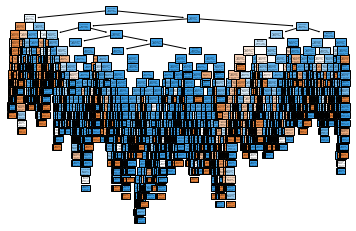

In [39]:
from sklearn.tree import plot_tree
plot_tree(model1, feature_names= X1_train.columns, class_names=["1","0"],filled=True)
plt.show()




In [37]:
O=pd.DataFrame(model1.feature_importances_,index=X1_train.columns)
O.columns=['importance']
O.sort_values(by='importance',inplace=True,ascending=False)
O


,importance
T_ch1,0.184329
T_ext,0.182778
CO2_ch1,0.180922
HR_ch1,0.136179
HR_ext,0.082929
Ihg,0.060528
Wd,0.058708
Ihd,0.056941
Ws,0.056685


In [171]:
#Premier modéle sans toucher a ces paramétre en obtient une perfomance de 81% sur l'ouverture et 97 sur ferméture 
#en ajoutent l'heure et le jour de la semaine on obtient 3% de plus sur le recall de l'ouverture 

In [172]:

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [173]:

from xgboost import XGBClassifier
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import xgboost as xgb

In [175]:
X1_scaled=pd.DataFrame(X1_scaled)
X1_scaled

,0,1,2,3,4,5,6,7,8
0,-0.544022,-0.581101,1.112563,1.378805,0.138519,-1.618386,-0.523294,-0.124198,0.005900
1,-0.544022,-0.581101,1.112563,-1.562368,-0.047416,-1.638854,-0.523294,-0.124198,0.005900
2,-0.544022,-0.581101,1.112563,-1.597278,-0.233352,-1.638854,0.014969,-0.124198,0.180966
3,-0.544022,-0.581101,1.112563,-1.614733,0.758304,-1.659322,0.014969,-0.124198,0.180966
4,-0.544022,-0.581101,1.112563,1.396260,0.262476,-1.659322,0.245653,-0.124198,0.176034
...,...,...,...,...,...,...,...,...,...
36436,1.555646,1.850386,-0.843082,-0.427791,-0.295330,1.513195,-0.061926,0.987647,-0.228343
36437,1.834403,-0.593886,-0.897405,0.069678,-0.233352,1.595066,-0.061926,0.987647,-0.228343
36438,1.912435,-0.593886,-1.006052,-0.436518,-0.109395,1.615534,-0.369504,0.709685,-0.802854
36439,1.960691,-0.593886,-0.951729,-0.139783,-0.357309,1.656470,-0.369504,0.709685,-0.802854


In [197]:
X1_scaled

,0,1,2,3,4,5,6,7,8
0,-0.544022,-0.581101,1.112563,1.378805,0.138519,-1.618386,-0.523294,-0.124198,0.005900
1,-0.544022,-0.581101,1.112563,-1.562368,-0.047416,-1.638854,-0.523294,-0.124198,0.005900
2,-0.544022,-0.581101,1.112563,-1.597278,-0.233352,-1.638854,0.014969,-0.124198,0.180966
3,-0.544022,-0.581101,1.112563,-1.614733,0.758304,-1.659322,0.014969,-0.124198,0.180966
4,-0.544022,-0.581101,1.112563,1.396260,0.262476,-1.659322,0.245653,-0.124198,0.176034
...,...,...,...,...,...,...,...,...,...
36436,1.555646,1.850386,-0.843082,-0.427791,-0.295330,1.513195,-0.061926,0.987647,-0.228343
36437,1.834403,-0.593886,-0.897405,0.069678,-0.233352,1.595066,-0.061926,0.987647,-0.228343
36438,1.912435,-0.593886,-1.006052,-0.436518,-0.109395,1.615534,-0.369504,0.709685,-0.802854
36439,1.960691,-0.593886,-0.951729,-0.139783,-0.357309,1.656470,-0.369504,0.709685,-0.802854


In [200]:
from xgboost import XGBClassifier
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import xgboost as xgb
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))



Train set: (29152, 11)
Test set: (7289, 11)


1    25740
0     3412
Name: fen_ch1, dtype: int64

1    6434
0     855
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.882958
0    0.117042
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.8827
0    0.1173
Name: fen_ch1, dtype: float64

In [201]:
boost = XGBClassifier()
def evaluation(boost):
    
    boost.fit(X1_train, y1_train)
    y_boost_pred = boost.predict(X1_test)
    Matrice=confusion_matrix(y1_test, y_boost_pred)
    print(Matrice)
    print(classification_report(y1_test, y_boost_pred))
evaluation(boost)

[13:40:27] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 746  109]
 [  40 6394]]
              precision    recall  f1-score   support

           0       0.95      0.87      0.91       855
           1       0.98      0.99      0.99      6434

    accuracy                           0.98      7289
   macro avg       0.97      0.93      0.95      7289
weighted avg       0.98      0.98      0.98      7289



In [202]:
#le XGBOOST meilleur que l'arbre de décesion avec un recall de 82 sur l'ouverture et une accuracy de 97%
#est si on rajoute deux variable l'heure et le jour de la semaine  on gagne 5 % sur le recall (87%) de l'ouverture de fentre et une accuracy de 98%
#si on normalise nous donné avec un standar scaler et ont entaine notre modéle ont perd en perfermance du modéle 

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

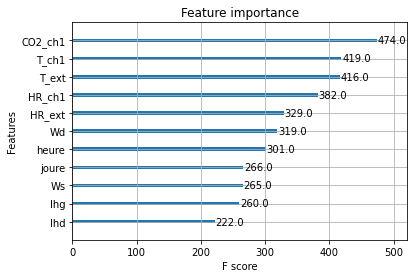

In [203]:
xgb.plot_importance(boost)

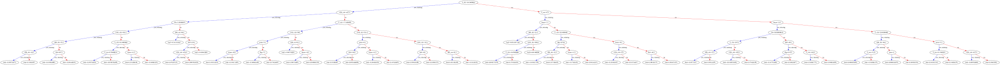

In [204]:

xgb.to_graphviz(boost, num_trees=2)

,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,T_ch1,HR_ch1,CO2_ch1
Date,,,,,,,,,
2018-12-12 19:20:00,0,0,88,345,2.0,-1.3,19.5,34.0,742.0
2018-12-12 19:25:00,0,0,88,8,1.7,-1.4,19.5,34.0,742.0
2018-12-12 19:30:00,0,0,88,4,1.4,-1.4,20.2,34.0,813.0
2018-12-12 19:35:00,0,0,88,2,3.0,-1.5,20.2,34.0,813.0
2018-12-12 19:40:00,0,0,88,347,2.2,-1.5,20.5,34.0,811.0
...,...,...,...,...,...,...,...,...,...
2019-04-18 08:40:00,40900,18827,52,138,1.3,14.0,20.1,42.0,647.0
2019-04-18 08:45:00,46330,-99,51,195,1.4,14.4,20.1,42.0,647.0
2019-04-18 08:50:00,47850,-99,49,137,1.6,14.5,19.7,40.0,414.0


#  ========================CHAMBRE1======================================

In [104]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score,confusion_matrix,classification_report
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import xgboost as xgb


In [105]:

X1_train, X1_test, y1_train, y1_test = train_test_split(X1_scaled, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (29152, 9)
Test set: (7289, 9)


1    25740
0     3412
Name: fen_ch1, dtype: int64

1    6434
0     855
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.882958
0    0.117042
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.8827
0    0.1173
Name: fen_ch1, dtype: float64

In [106]:
DecisionTreeClassifier =DecisionTreeClassifier(random_state=0)
RandomForest =RandomForestClassifier(n_estimators=50, random_state=0,)
AdaBoost = AdaBoostClassifier(random_state=0)
Regression_logistic=LogisticRegression(random_state = 0)
SVM = SVC(random_state=0)
KNN = KNeighborsClassifier()
XGboost = XGBClassifier()

In [107]:
dict_of_models = {'DecisionTreeClassifier':DecisionTreeClassifier,
                  'RandomForest': RandomForest,
                  'AdaBoost' : AdaBoost,
                  'XGboost':XGboost,
                  'Regression_logistic':Regression_logistic,
                  'SVM': SVM,
                  'KNN': KNN
                  
                 }

In [108]:
def evaluation(model):
    
    model.fit(X1_train, y1_train)
    ypred = model.predict(X1_test)
    
    print(confusion_matrix(y1_test, ypred))
    print(classification_report(y1_test, ypred))
    print('=======================================================')

In [109]:
for name, model in dict_of_models.items():
    print(name)
    evaluation(model)
    liste=['DecisionTreeClassifier','RandomForest','AdaBoost','XGboost']
    #if name == liste.index:
    #    O=pd.DataFrame(model.feature_importances_,index=X1.columns)
    #    O.columns=['importance']
    #    O.sort_values(by='importance',inplace=True,ascending=False)
    #    display(O)
   # if name=='Regression_logistic':
    #pd.DataFrame(np.concatenate([Regression_logistic.intercept_.reshape(-1,1),
     #                        Regression_logistic.coef_],axis=1),
    #index = ["coef"],
    #columns = ["constante"]+list(X1.columns)).T
        

DecisionTreeClassifier
[[ 690  165]
 [ 166 6268]]
              precision    recall  f1-score   support

           0       0.81      0.81      0.81       855
           1       0.97      0.97      0.97      6434

    accuracy                           0.95      7289
   macro avg       0.89      0.89      0.89      7289
weighted avg       0.95      0.95      0.95      7289

RandomForest
[[ 720  135]
 [  25 6409]]
              precision    recall  f1-score   support

           0       0.97      0.84      0.90       855
           1       0.98      1.00      0.99      6434

    accuracy                           0.98      7289
   macro avg       0.97      0.92      0.94      7289
weighted avg       0.98      0.98      0.98      7289

AdaBoost
[[ 351  504]
 [ 170 6264]]
              precision    recall  f1-score   support

           0       0.67      0.41      0.51       855
           1       0.93      0.97      0.95      6434

    accuracy                           0.91      7289
  

# #=================== CHAMBRE 2 ==========================#

In [87]:

X2_train, X2_test, y2_train, y2_test = train_test_split(X2_scaled, y2, test_size=0.2, random_state=5)
print('Train set:', X2_train.shape)
print('Test set:', X2_test.shape)
display(y2_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y2_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y2_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y2_test.value_counts(normalize=True))

Train set: (23431, 9)
Test set: (5858, 9)


1    20174
0     3257
Name: fen_ch2, dtype: int64

1    5037
0     821
Name: fen_ch2, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.860996
0    0.139004
Name: fen_ch2, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.85985
0    0.14015
Name: fen_ch2, dtype: float64

In [88]:
def evaluation2(model):
    
    model.fit(X2_train, y2_train)
    y2pred = model.predict(X2_test)
    
    print(confusion_matrix(y2_test, y2pred))
    print(classification_report(y2_test, y2pred))
    print('=======================================================')
for name, model in dict_of_models.items():
    print(name)
    evaluation2(model)
    #O=pd.DataFrame(model.feature_importances_,index=X1_train.columns)
    #O.columns=['importance']
    #O.sort_values(by='importance',inplace=True,ascending=False)
    #display(O)
    

DecisionTreeClassifier
[[ 700  121]
 [ 103 4934]]
              precision    recall  f1-score   support

           0       0.87      0.85      0.86       821
           1       0.98      0.98      0.98      5037

    accuracy                           0.96      5858
   macro avg       0.92      0.92      0.92      5858
weighted avg       0.96      0.96      0.96      5858

RandomForest
[[ 704  117]
 [  37 5000]]
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       821
           1       0.98      0.99      0.98      5037

    accuracy                           0.97      5858
   macro avg       0.96      0.93      0.94      5858
weighted avg       0.97      0.97      0.97      5858

AdaBoost
[[ 506  315]
 [ 170 4867]]
              precision    recall  f1-score   support

           0       0.75      0.62      0.68       821
           1       0.94      0.97      0.95      5037

    accuracy                           0.92      5858
  

# #======================CUISINE================================#    

In [89]:
Xc_train, Xc_test, yc_train, yc_test = train_test_split(Xc_scaled, yc, test_size=0.2, random_state=5)
print('Train set:', Xc_train.shape)
print('Test set:', Xc_test.shape)
display(yc_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(yc_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(yc_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(yc_test.value_counts(normalize=True))

Train set: (29248, 8)
Test set: (7312, 8)


0    15880
1    13368
Name: fen_cuisine, dtype: int64

0    3941
1    3371
Name: fen_cuisine, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


0    0.542943
1    0.457057
Name: fen_cuisine, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


0    0.538977
1    0.461023
Name: fen_cuisine, dtype: float64

In [90]:
def evaluation_c(model):
    
    model.fit(Xc_train, yc_train)
    ycpred = model.predict(Xc_test)
    
    print(confusion_matrix(yc_test, ycpred))
    print(classification_report(yc_test, ycpred))
    print('=======================================================')
for name, model in dict_of_models.items():
    print(name)
    evaluation_c(model)
    #O=pd.DataFrame(model.feature_importances_,index=X1_train.columns)
    #O.columns=['importance']
    #O.sort_values(by='importance',inplace=True,ascending=False)
    #display(O)
    

DecisionTreeClassifier
[[3632  309]
 [ 361 3010]]
              precision    recall  f1-score   support

           0       0.91      0.92      0.92      3941
           1       0.91      0.89      0.90      3371

    accuracy                           0.91      7312
   macro avg       0.91      0.91      0.91      7312
weighted avg       0.91      0.91      0.91      7312

RandomForest
[[3813  128]
 [ 190 3181]]
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3941
           1       0.96      0.94      0.95      3371

    accuracy                           0.96      7312
   macro avg       0.96      0.96      0.96      7312
weighted avg       0.96      0.96      0.96      7312

AdaBoost
[[2888 1053]
 [1326 2045]]
              precision    recall  f1-score   support

           0       0.69      0.73      0.71      3941
           1       0.66      0.61      0.63      3371

    accuracy                           0.67      7312
  

# ========================= SALON =============================#

In [91]:
Xs_train, Xs_test, ys_train, ys_test = train_test_split(Xs, ys, test_size=0.2, random_state=5)
print('Train set:', Xs_train.shape)
print('Test set:', Xs_test.shape)
display(ys_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(ys_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(ys_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(ys_test.value_counts(normalize=True))

Train set: (29153, 9)
Test set: (7289, 9)


1    24584
0     4569
Name: fen_salon, dtype: int64

1    6116
0    1173
Name: fen_salon, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.843275
0    0.156725
Name: fen_salon, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.839073
0    0.160927
Name: fen_salon, dtype: float64

In [92]:
def evaluation_s(model):
    
    model.fit(Xs_train, ys_train)
    yspred = model.predict(Xs_test)
    
    print(confusion_matrix(ys_test, yspred))
    print(classification_report(ys_test, yspred))
    print('=======================================================')
for name, model in dict_of_models.items():
   
    print(name)
    evaluation_s(model)
    #O=pd.DataFrame(model.feature_importances_,index=X1_train.columns)
    #O.columns=['importance']
    #O.sort_values(by='importance',inplace=True,ascending=False)
    #display(O)
    

DecisionTreeClassifier
[[ 899  274]
 [ 283 5833]]
              precision    recall  f1-score   support

           0       0.76      0.77      0.76      1173
           1       0.96      0.95      0.95      6116

    accuracy                           0.92      7289
   macro avg       0.86      0.86      0.86      7289
weighted avg       0.92      0.92      0.92      7289

RandomForest
[[ 929  244]
 [  89 6027]]
              precision    recall  f1-score   support

           0       0.91      0.79      0.85      1173
           1       0.96      0.99      0.97      6116

    accuracy                           0.95      7289
   macro avg       0.94      0.89      0.91      7289
weighted avg       0.95      0.95      0.95      7289

AdaBoost
[[ 470  703]
 [ 200 5916]]
              precision    recall  f1-score   support

           0       0.70      0.40      0.51      1173
           1       0.89      0.97      0.93      6116

    accuracy                           0.88      7289
  

In [111]:
X1_scaled.corr()

,0,1,2,3,4,5,6,7,8
0,1.000000,0.674811,-0.503947,-0.038003,0.169925,0.452983,0.388015,-0.243489,-0.227089
1,0.674811,1.000000,-0.324800,-0.019975,0.204664,0.322931,0.236249,-0.124115,-0.208741
2,-0.503947,-0.324800,1.000000,-0.111749,-0.367092,-0.736663,-0.249832,0.447181,0.324666
3,-0.038003,-0.019975,-0.111749,1.000000,0.217286,-0.018531,-0.027304,-0.065116,-0.040763
4,0.169925,0.204664,-0.367092,0.217286,1.000000,0.253727,-0.039329,-0.109149,-0.161184
5,0.452983,0.322931,-0.736663,-0.018531,0.253727,1.000000,0.111745,0.094526,-0.249522
6,0.388015,0.236249,-0.249832,-0.027304,-0.039329,0.111745,1.000000,-0.386483,0.103178
7,-0.243489,-0.124115,0.447181,-0.065116,-0.109149,0.094526,-0.386483,1.000000,0.434789
8,-0.227089,-0.208741,0.324666,-0.040763,-0.161184,-0.249522,0.103178,0.434789,1.000000


In [112]:
X1.corr()

,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,T_ch1,HR_ch1,CO2_ch1
Ihg,1.000000,0.674811,-0.503947,-0.038003,0.169925,0.452983,0.388015,-0.243489,-0.227089
Ihd,0.674811,1.000000,-0.324800,-0.019975,0.204664,0.322931,0.236249,-0.124115,-0.208741
HR_ext,-0.503947,-0.324800,1.000000,-0.111749,-0.367092,-0.736663,-0.249832,0.447181,0.324666
Wd,-0.038003,-0.019975,-0.111749,1.000000,0.217286,-0.018531,-0.027304,-0.065116,-0.040763
Ws,0.169925,0.204664,-0.367092,0.217286,1.000000,0.253727,-0.039329,-0.109149,-0.161184
T_ext,0.452983,0.322931,-0.736663,-0.018531,0.253727,1.000000,0.111745,0.094526,-0.249522
T_ch1,0.388015,0.236249,-0.249832,-0.027304,-0.039329,0.111745,1.000000,-0.386483,0.103178
HR_ch1,-0.243489,-0.124115,0.447181,-0.065116,-0.109149,0.094526,-0.386483,1.000000,0.434789
CO2_ch1,-0.227089,-0.208741,0.324666,-0.040763,-0.161184,-0.249522,0.103178,0.434789,1.000000
